In [285]:
#!pip install sqlalchemy
#!pip install --upgrade sqlalchemy snowflake-connector-python

In [1]:
import snowflake.connector
import pandas as pd
import smtplib
from email.mime.text import MIMEText
from email.mime.multipart import MIMEMultipart
from sqlalchemy import create_engine
import scipy.stats as stats

import pandas as pd # dataframe manipulation
import numpy as np # linear algebra

# data visualization
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import plotly.express as px
import plotly.graph_objects as go
import seaborn as sns
from plotly.subplots import make_subplots

# sklearn 
from sklearn.cluster import KMeans

from sklearn.metrics import silhouette_score, silhouette_samples, accuracy_score, classification_report
from yellowbrick.cluster import KElbowVisualizer

In [2]:

# Snowflake credentials
username = 'Harshiteggoz'
password = 'Eggoz@123'
account = 'wt08714.ap-south-1.aws'
warehouse = 'COMPUTE_WH'
database = 'EGGOZDB'
schema = 'MAPLEMONK'


credentials = {
    'account': 'wt08714.ap-south-1.aws',
    'user': 'Harshiteggoz',
    'password': 'Eggoz@123',
    'database': 'GGOZDB',
    'schema': 'MAPLEMONK',
    'warehouse': 'COMPUTE_WH',
    
}

In [3]:
con = snowflake.connector.connect(
    account = credentials['account'],
    user = credentials['user'],
    password = credentials['password'],
    database = credentials['database'],
    schema = credentials['schema'],
    warehouse = credentials['warehouse'],

)

In [4]:
query = "USE EGGOZDB"

In [5]:
cur = con.cursor()
cur.execute(query)

In [6]:
# SQL query
query1 = """
SELECT
    retailer_id,
    area_classification,
    city_name,
    case when (AVG(overall_eggs_sold) - AVG(overall_eggs_return))=0 then 0 
        else (AVG(overall_revenue) - AVG(overall_amount_return))/(AVG(overall_eggs_sold) - AVG(overall_eggs_return)) end AS overall_net_landing_price,
    CASE WHEN AVG(overall_eggs_sold) = 0 THEN 1
         ELSE (AVG(overall_eggs_return) + AVG(overall_eggs_replaced)) / AVG(overall_eggs_sold) END
        AS overall_ret_rep_per,
    CASE WHEN SUM(mom_number_of_bills) = 0 THEN 0
         ELSE AVG(overall_revenue) / SUM(mom_number_of_bills) END
        AS overall_aov,
    AVG(mom_aov) AS mom_avg_aov,
    AVG(mom_ret_rep_per) AS mom_avg_ret_rep_per,
    AVG(billing_months_count) / AVG(age_in_month) AS bill_rate,
    AVG(mom_number_of_bills) AS mom_avg_billing_frequency,
    AVG(overall_revenue) / AVG(overall_area_revenue) AS revenue_contribution_area_wise,
    AVG(mom_revenue_contribution_area_wise) AS mom_avg_revenue_contribution_area_wise
FROM
(
    SELECT
        *,
        mom_revenue / (CASE WHEN mom_number_of_bills > 0 THEN mom_number_of_bills ELSE 1 END) AS mom_aov,
        CASE WHEN mom_eggs_sold = 0 AND (mom_eggs_replaced + mom_eggs_return) = 0 THEN 0
             WHEN mom_eggs_sold = 0 AND (mom_eggs_replaced + mom_eggs_return) > 0 THEN 1
             ELSE (mom_eggs_replaced + mom_eggs_return) / mom_eggs_sold END AS mom_ret_rep_per,
        COUNT_IF(mom_number_of_bills > 0) OVER (PARTITION BY retailer_id) AS billing_months_count,
        mom_revenue / mom_area_revenue AS mom_revenue_contribution_area_wise
    FROM
    (
        SELECT
            DISTINCT
            YEAR(date) AS year,
            MONTH(date) AS month,
            retailer_id,
            area_classification,
            city_name,
            SUM(revenue) OVER (PARTITION BY retailer_id) AS overall_revenue,
            SUM(amount_return) OVER (PARTITION BY retailer_id) AS overall_amount_return,
            SUM(eggs_return) OVER (PARTITION BY retailer_id) AS overall_eggs_return,
            SUM(eggs_replaced) OVER (PARTITION BY retailer_id) AS overall_eggs_replaced,
            SUM(eggs_sold) OVER (PARTITION BY retailer_id) AS overall_eggs_sold,
            SUM(CASE WHEN revenue > 0 THEN 1 ELSE 0 END) OVER (PARTITION BY retailer_id) AS overall_number_of_bills,
            SUM(revenue) OVER (PARTITION BY retailer_id, MONTH(date), YEAR(date)) AS mom_revenue,
            SUM(amount_return) OVER (PARTITION BY retailer_id, MONTH(date), YEAR(date)) AS mom_amount_return,
            SUM(eggs_return) OVER (PARTITION BY retailer_id, MONTH(date), YEAR(date)) AS mom_eggs_return,
            SUM(eggs_replaced) OVER (PARTITION BY retailer_id, MONTH(date), YEAR(date)) AS mom_eggs_replaced,
            SUM(eggs_sold) OVER (PARTITION BY retailer_id, MONTH(date), YEAR(date)) AS mom_eggs_sold,
            SUM(CASE WHEN revenue > 0 THEN 1 ELSE 0 END) OVER (PARTITION BY retailer_id, MONTH(date), YEAR(date)) AS mom_number_of_bills,
            DATEDIFF('month', MIN(date) OVER (PARTITION BY retailer_id), MAX(date) OVER (PARTITION BY retailer_id)) + 1 AS age_in_month,
            SUM(revenue) OVER (PARTITION BY area_classification, MONTH(date), YEAR(date)) AS mom_area_revenue,
            SUM(revenue) OVER (PARTITION BY area_classification) AS overall_area_revenue
        FROM
        (
            SELECT
                date,
                retailer_id,
                area_classification,
                city_name,
                SUM(sku_order_price_amount) AS revenue,
                SUM(sku_return_amount) AS amount_return,
                SUM(return_eggs) AS eggs_return,
                SUM(replaced_eggs) AS eggs_replaced,
                SUM(eggs) AS eggs_sold
            FROM
                eggozdb.maplemonk.darjan_sales_return_replace_promo_primary_and_secondary 
            WHERE
                product_type = 'Eggoz Premium' AND retailer_category = 'General Trader'
            GROUP BY
                date,
                retailer_id,
                area_classification,
                city_name
        ) t1
    ) t2
    WHERE
        mom_area_revenue > 0
) t3
GROUP BY
    retailer_id,
    area_classification,
    city_name
"""


In [7]:
cur.execute(query1)

In [8]:
table_df = pd.read_sql_query(query1,con)

C:\Users\User\AppData\Local\Temp\ipykernel_8300\2550124006.py:1: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  table_df = pd.read_sql_query(query1,con)


In [9]:
table_df.head()

,RETAILER_ID,AREA_CLASSIFICATION,CITY_NAME,OVERALL_NET_LANDING_PRICE,OVERALL_RET_REP_PER,OVERALL_AOV,MOM_AVG_AOV,MOM_AVG_RET_REP_PER,BILL_RATE,MOM_AVG_BILLING_FREQUENCY,REVENUE_CONTRIBUTION_AREA_WISE,MOM_AVG_REVENUE_CONTRIBUTION_AREA_WISE
0,1114.0,Gurgaon-GT,Gurgaon,9.565497,0.280605,2457.508088,2607.138686,0.295014,0.935484,4.689655,0.004375,0.004788
1,1147.0,Delhi-GT,Delhi,10.762171,0.186366,974.029592,989.483856,0.443896,1.000000,3.161290,0.001307,0.001405
2,2528.0,Noida-GT,Noida,12.401806,0.611738,499.454545,486.435897,0.590322,0.800000,1.692308,0.000364,0.000622
3,3704.0,Delhi-GT,Delhi,9.259874,0.796378,2182.521739,1725.909722,1.888977,0.916667,1.916667,0.000688,0.001398
4,1521.0,Delhi-GT,Delhi,8.892436,0.142434,7273.531381,7338.586361,0.142447,1.000000,7.966667,0.023809,0.025077


In [10]:
table_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5723 entries, 0 to 5722
Data columns (total 12 columns):
 #   Column                                  Non-Null Count  Dtype  
---  ------                                  --------------  -----  
 0   RETAILER_ID                             5723 non-null   float64
 1   AREA_CLASSIFICATION                     5723 non-null   object 
 2   CITY_NAME                               5723 non-null   object 
 3   OVERALL_NET_LANDING_PRICE               5723 non-null   float64
 4   OVERALL_RET_REP_PER                     5723 non-null   float64
 5   OVERALL_AOV                             5723 non-null   float64
 6   MOM_AVG_AOV                             5723 non-null   float64
 7   MOM_AVG_RET_REP_PER                     5723 non-null   float64
 8   BILL_RATE                               5723 non-null   float64
 9   MOM_AVG_BILLING_FREQUENCY               5723 non-null   float64
 10  REVENUE_CONTRIBUTION_AREA_WISE          5723 non-null   floa

In [11]:
table_df.isna().sum()

RETAILER_ID                               0
AREA_CLASSIFICATION                       0
CITY_NAME                                 0
OVERALL_NET_LANDING_PRICE                 0
OVERALL_RET_REP_PER                       0
OVERALL_AOV                               0
MOM_AVG_AOV                               0
MOM_AVG_RET_REP_PER                       0
BILL_RATE                                 0
MOM_AVG_BILLING_FREQUENCY                 0
REVENUE_CONTRIBUTION_AREA_WISE            0
MOM_AVG_REVENUE_CONTRIBUTION_AREA_WISE    0
dtype: int64

In [12]:
table_df.nunique()

RETAILER_ID                               5723
AREA_CLASSIFICATION                         12
CITY_NAME                                   14
OVERALL_NET_LANDING_PRICE                 4810
OVERALL_RET_REP_PER                       3596
OVERALL_AOV                               4880
MOM_AVG_AOV                               4970
MOM_AVG_RET_REP_PER                       3366
BILL_RATE                                  210
MOM_AVG_BILLING_FREQUENCY                  775
REVENUE_CONTRIBUTION_AREA_WISE            5198
MOM_AVG_REVENUE_CONTRIBUTION_AREA_WISE    5529
dtype: int64

In [13]:
table_df["AREA_CLASSIFICATION"].unique()

array(['Gurgaon-GT', 'Delhi-GT', 'Noida-GT', 'Indore-GT', 'Bangalore-GT',
       'Lucknow-GT', 'Allahabad-GT', 'Kolkata-GT', 'Bhopal-GT',
       'Jaipur-GT', 'Chandigarh-GT', 'Patna-GT'], dtype=object)

In [14]:
table_df[table_df["CITY_NAME"]=="Faridabad"]

,RETAILER_ID,AREA_CLASSIFICATION,CITY_NAME,OVERALL_NET_LANDING_PRICE,OVERALL_RET_REP_PER,OVERALL_AOV,MOM_AVG_AOV,MOM_AVG_RET_REP_PER,BILL_RATE,MOM_AVG_BILLING_FREQUENCY,REVENUE_CONTRIBUTION_AREA_WISE,MOM_AVG_REVENUE_CONTRIBUTION_AREA_WISE
184,5696.0,Gurgaon-GT,Faridabad,11.617647,0.308824,526.666667,526.666667,0.308824,1.000000,3.000000,0.000021,0.000763
185,8142.0,Gurgaon-GT,Faridabad,11.422131,0.168033,348.375000,309.000000,0.274745,0.800000,1.600000,0.000036,0.000277
194,916.0,Gurgaon-GT,Faridabad,9.048811,0.191976,1361.000000,1499.148039,0.189361,0.809524,2.705882,0.000820,0.001421
253,9564.0,Gurgaon-GT,Faridabad,11.625000,0.071429,325.500000,329.375000,0.062500,1.000000,2.500000,0.000021,0.000393
361,9201.0,Gurgaon-GT,Faridabad,11.210526,0.000000,426.000000,426.000000,0.000000,1.000000,1.000000,0.000011,0.000257
...,...,...,...,...,...,...,...,...,...,...,...,...
5620,9871.0,Gurgaon-GT,Faridabad,12.392857,0.119048,347.000000,347.000000,0.119048,1.000000,3.000000,0.000014,0.000487
5685,5652.0,Gurgaon-GT,Faridabad,0.000000,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
5692,9304.0,Gurgaon-GT,Faridabad,11.750000,0.000000,176.250000,176.250000,0.000000,1.000000,1.000000,0.000005,0.000100
5694,5644.0,Gurgaon-GT,Faridabad,0.000000,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000


In [15]:
table_df[table_df["RETAILER_ID"]==872]

,RETAILER_ID,AREA_CLASSIFICATION,CITY_NAME,OVERALL_NET_LANDING_PRICE,OVERALL_RET_REP_PER,OVERALL_AOV,MOM_AVG_AOV,MOM_AVG_RET_REP_PER,BILL_RATE,MOM_AVG_BILLING_FREQUENCY,REVENUE_CONTRIBUTION_AREA_WISE,MOM_AVG_REVENUE_CONTRIBUTION_AREA_WISE
2864,872.0,Delhi-GT,Delhi,9.465709,0.174882,2689.873118,2750.775137,0.218546,1.0,5.8125,0.006853,0.00809


In [16]:
table_df.shape

(5723, 12)

In [17]:
table_df.head()

,RETAILER_ID,AREA_CLASSIFICATION,CITY_NAME,OVERALL_NET_LANDING_PRICE,OVERALL_RET_REP_PER,OVERALL_AOV,MOM_AVG_AOV,MOM_AVG_RET_REP_PER,BILL_RATE,MOM_AVG_BILLING_FREQUENCY,REVENUE_CONTRIBUTION_AREA_WISE,MOM_AVG_REVENUE_CONTRIBUTION_AREA_WISE
0,1114.0,Gurgaon-GT,Gurgaon,9.565497,0.280605,2457.508088,2607.138686,0.295014,0.935484,4.689655,0.004375,0.004788
1,1147.0,Delhi-GT,Delhi,10.762171,0.186366,974.029592,989.483856,0.443896,1.000000,3.161290,0.001307,0.001405
2,2528.0,Noida-GT,Noida,12.401806,0.611738,499.454545,486.435897,0.590322,0.800000,1.692308,0.000364,0.000622
3,3704.0,Delhi-GT,Delhi,9.259874,0.796378,2182.521739,1725.909722,1.888977,0.916667,1.916667,0.000688,0.001398
4,1521.0,Delhi-GT,Delhi,8.892436,0.142434,7273.531381,7338.586361,0.142447,1.000000,7.966667,0.023809,0.025077


In [18]:
table_df.columns

Index(['RETAILER_ID', 'AREA_CLASSIFICATION', 'CITY_NAME',
       'OVERALL_NET_LANDING_PRICE', 'OVERALL_RET_REP_PER', 'OVERALL_AOV',
       'MOM_AVG_AOV', 'MOM_AVG_RET_REP_PER', 'BILL_RATE',
       'MOM_AVG_BILLING_FREQUENCY', 'REVENUE_CONTRIBUTION_AREA_WISE',
       'MOM_AVG_REVENUE_CONTRIBUTION_AREA_WISE'],
      dtype='object')

In [19]:
columns = ['AREA_CLASSIFICATION','OVERALL_NET_LANDING_PRICE', 'OVERALL_RET_REP_PER', 'OVERALL_AOV',
       'MOM_AVG_AOV', 'MOM_AVG_RET_REP_PER', 'BILL_RATE',
       'MOM_AVG_BILLING_FREQUENCY', 'REVENUE_CONTRIBUTION_AREA_WISE',
       'MOM_AVG_REVENUE_CONTRIBUTION_AREA_WISE']

In [20]:
sum_df = table_df[columns]

In [21]:
encode_area ={'Gurgaon-GT':0, 'Allahabad-GT':1, 'Delhi-GT':2, 'Lucknow-GT':3,
       'Bhopal-GT':4, 'Noida-GT':5, 'Indore-GT':6, 'Bangalore-GT':7, 'Kolkata-GT':8,
       'Jaipur-GT':9, 'Patna-GT':10, 'Chandigarh-GT':11}
sum_df["AREA_CLASSIFICATION"]=sum_df["AREA_CLASSIFICATION"].replace(encode_area)

C:\Users\User\AppData\Local\Temp\ipykernel_8300\2233361430.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sum_df["AREA_CLASSIFICATION"]=sum_df["AREA_CLASSIFICATION"].replace(encode_area)


Pairplot

<Figure size 3000x3000 with 0 Axes>

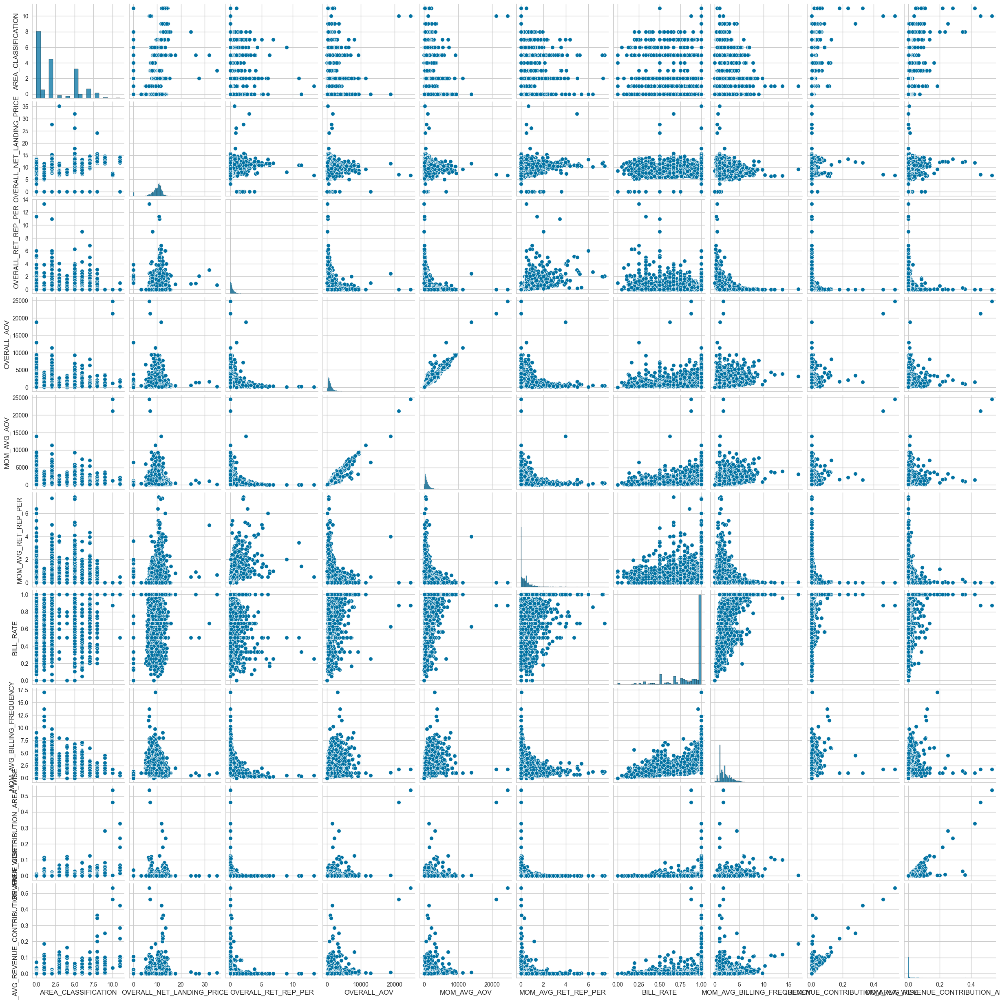

In [22]:
plt.figure(figsize=(30,30))
sns.pairplot(sum_df)
plt.show()

Correlation Plot

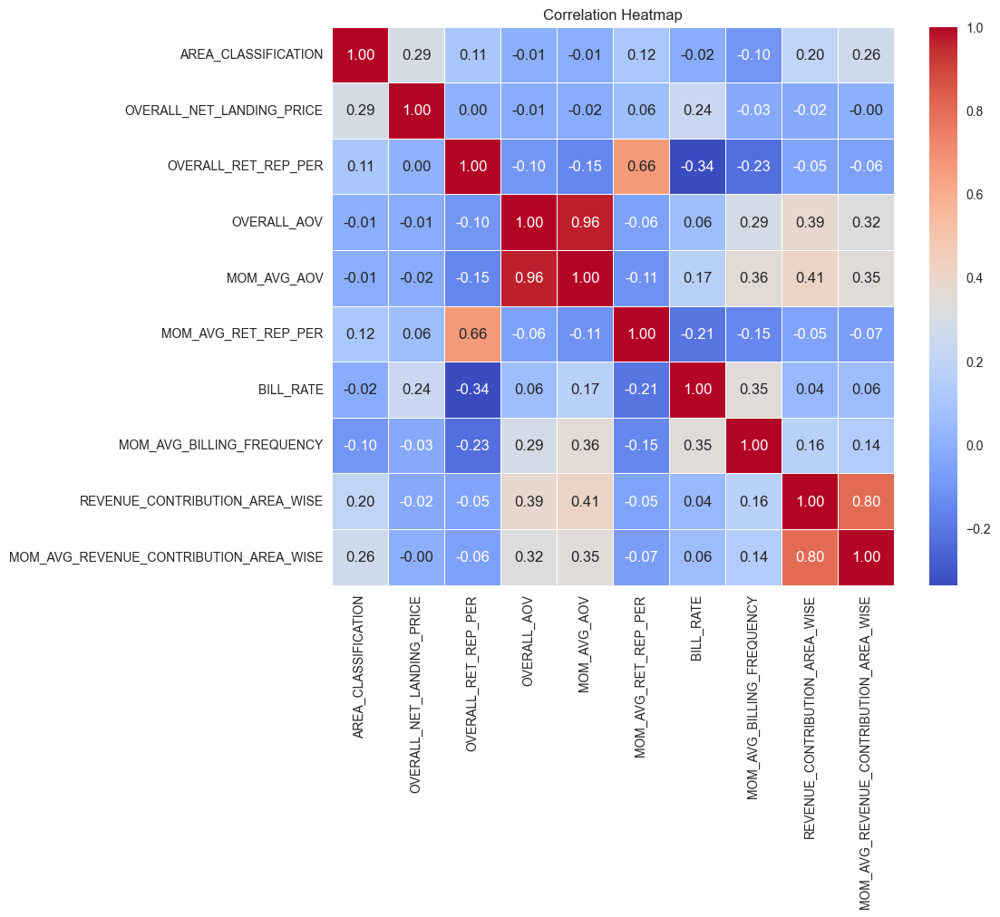

In [23]:
# Calculate correlation matrix
correlation_matrix = sum_df.corr()

# Create a heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=.5)
plt.title('Correlation Heatmap')
plt.show()

In [45]:
# Identify and remove one of the dependent features
threshold = 0.6  # Set your correlation threshold
highly_correlated_pairs = (correlation_matrix.abs() > threshold) & (correlation_matrix.abs() < 1.0)
correlated_features = [column for column in highly_correlated_pairs.columns if any(highly_correlated_pairs[column])]
print(f"{correlated_features} are the highly correlated features ")


['OVERALL_RET_REP_PER', 'OVERALL_AOV', 'MOM_AVG_AOV', 'MOM_AVG_RET_REP_PER', 'REVENUE_CONTRIBUTION_AREA_WISE', 'MOM_AVG_REVENUE_CONTRIBUTION_AREA_WISE'] are the highly correlated features 


In [46]:
sum_df.columns

Index(['AREA_CLASSIFICATION', 'OVERALL_NET_LANDING_PRICE',
       'OVERALL_RET_REP_PER', 'OVERALL_AOV', 'MOM_AVG_AOV',
       'MOM_AVG_RET_REP_PER', 'BILL_RATE', 'MOM_AVG_BILLING_FREQUENCY',
       'REVENUE_CONTRIBUTION_AREA_WISE',
       'MOM_AVG_REVENUE_CONTRIBUTION_AREA_WISE'],
      dtype='object')

Standard Scaler

In [47]:

from sklearn.preprocessing import StandardScaler


# Initialize the StandardScaler
scaler = StandardScaler()

# Fit and transform the selected numerical columns
sum_df_scaled = pd.DataFrame(scaler.fit_transform(sum_df), columns=sum_df.columns)

# Now, sum_df contains the scaled values for the numerical columns


Min Max Scaler

In [48]:

from sklearn.preprocessing import MinMaxScaler
from scipy.stats import zscore


# Initialize the StandardScaler
scaler = MinMaxScaler()


sum_df_normalized = pd.DataFrame(scaler.fit_transform(sum_df), columns=sum_df.columns)
# Now, sum_df contains the scaled values for the numerical columns
# after normalization


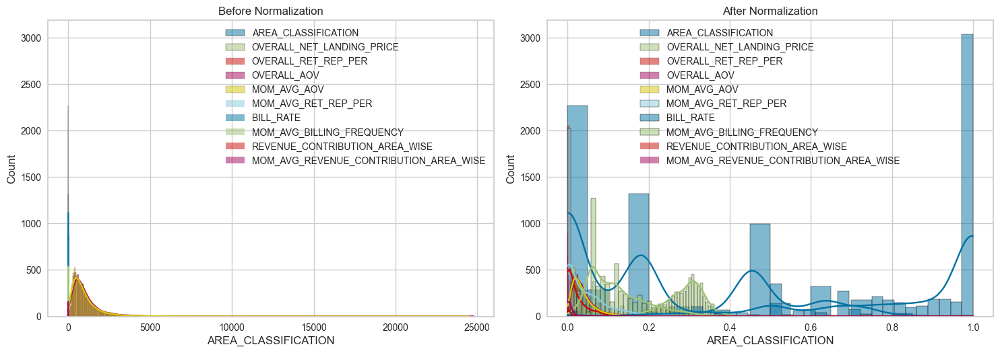

In [49]:
# Set the figure size
plt.figure(figsize=(15, 10))

# Plot distributions before normalization
plt.subplot(2, 2, 1)
plt.title('Before Normalization')
for i, column in enumerate(sum_df.columns):
    sns.histplot(sum_df[column], kde=True, label=column)
plt.legend()

# Plot distributions after normalization
plt.subplot(2, 2, 2)
plt.title('After Normalization')
for i, column in enumerate(sum_df_normalized.columns):
    sns.histplot(sum_df_normalized[column], kde=True, label=column)
plt.legend()

# Adjust layout
plt.tight_layout()
plt.show()

# Distribution before normalization

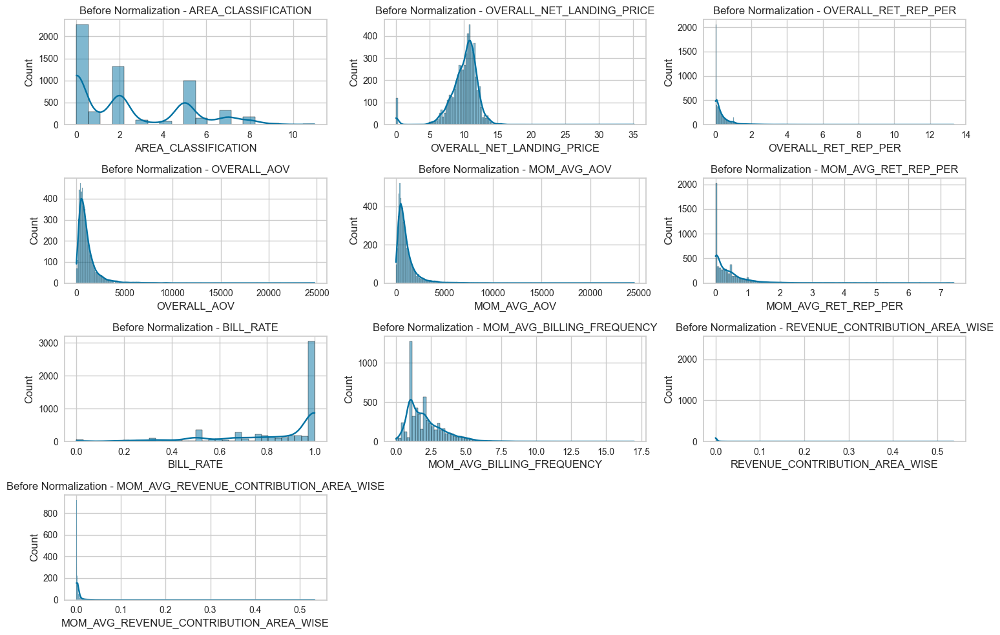

In [32]:
# Plot distributions before normalization
plt.figure(figsize=(15, 10))
num_columns = len(sum_df.columns)
num_plots_per_row = 3

num_rows = (num_columns // num_plots_per_row) + (num_columns % num_plots_per_row > 0)  # Calculate the number of rows

for i, column in enumerate(sum_df.columns):
    plt.subplot(num_rows, num_plots_per_row, i + 1)
    plt.title(f'Before Normalization - {column}')
    sns.histplot(sum_df[column], kde=True)

# Adjust layout
plt.tight_layout()
plt.show()


# Distribution after normalization Min Max

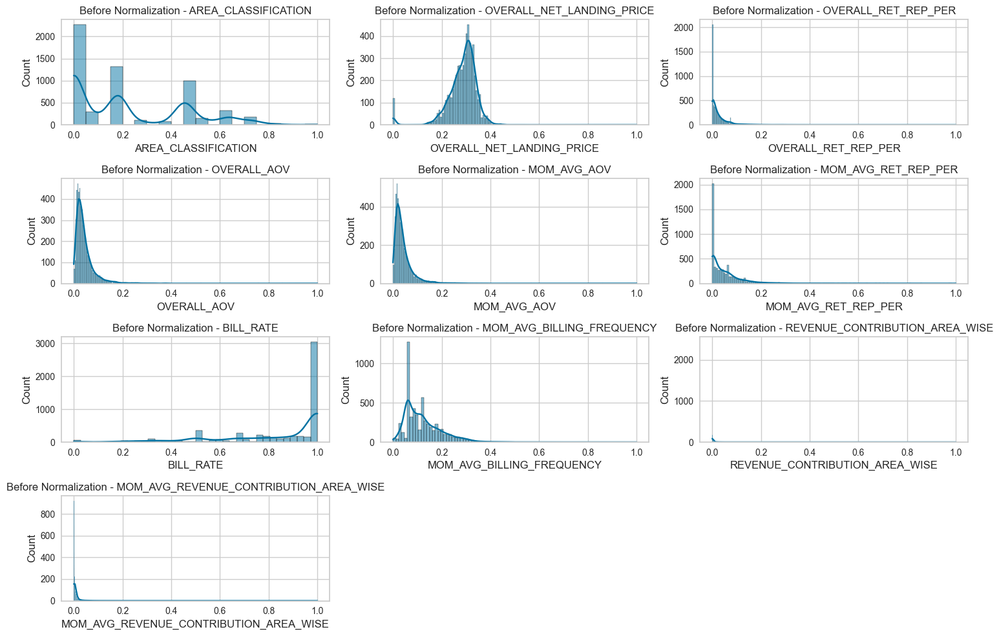

In [33]:
# Plot distributions before normalization
plt.figure(figsize=(15, 10))
num_columns = len(sum_df_normalized.columns)
num_plots_per_row = 3

num_rows = (num_columns // num_plots_per_row) + (num_columns % num_plots_per_row > 0)  # Calculate the number of rows

for i, column in enumerate(sum_df_normalized.columns):
    plt.subplot(num_rows, num_plots_per_row, i + 1)
    plt.title(f'Before Normalization - {column}')
    sns.histplot(sum_df_normalized[column], kde=True)

# Adjust layout
plt.tight_layout()
plt.show()


# Distribution after Standard Scaler

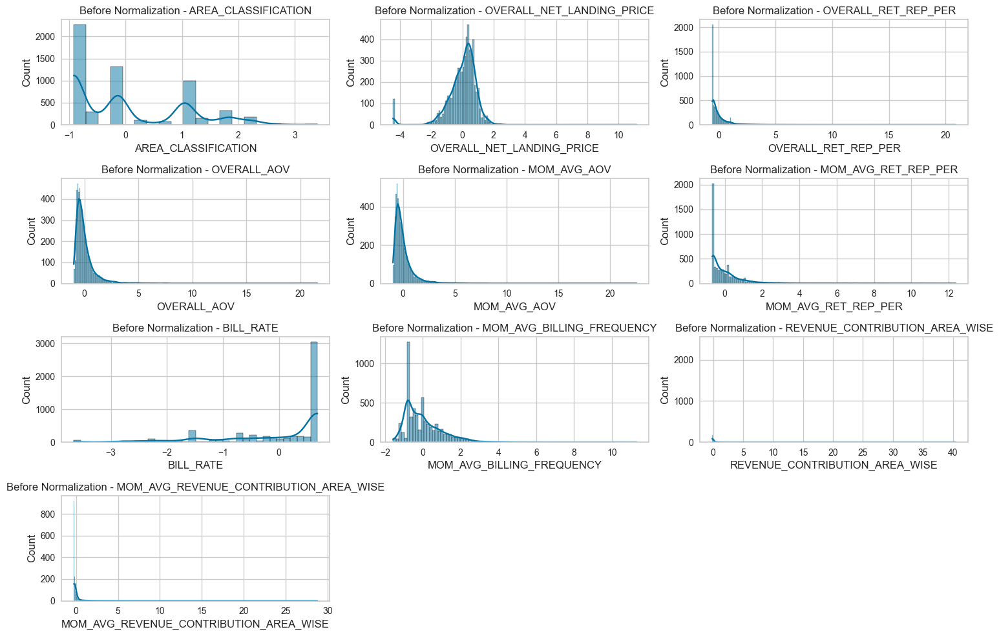

In [34]:
# Plot distributions before normalization
plt.figure(figsize=(15, 10))
num_columns = len(sum_df_scaled.columns)
num_plots_per_row = 3

num_rows = (num_columns // num_plots_per_row) + (num_columns % num_plots_per_row > 0)  # Calculate the number of rows

for i, column in enumerate(sum_df_scaled.columns):
    plt.subplot(num_rows, num_plots_per_row, i + 1)
    plt.title(f'Before Normalization - {column}')
    sns.histplot(sum_df_scaled[column], kde=True)

# Adjust layout
plt.tight_layout()
plt.show()


In [35]:
sum_df.columns

Index(['AREA_CLASSIFICATION', 'OVERALL_NET_LANDING_PRICE',
       'OVERALL_RET_REP_PER', 'OVERALL_AOV', 'MOM_AVG_AOV',
       'MOM_AVG_RET_REP_PER', 'BILL_RATE', 'MOM_AVG_BILLING_FREQUENCY',
       'REVENUE_CONTRIBUTION_AREA_WISE',
       'MOM_AVG_REVENUE_CONTRIBUTION_AREA_WISE'],
      dtype='object')

Removing the 'OVERALL_AOV' and 'REVENUE_CONTRIBUTION_AREA_WISE' due to high correlation

In [36]:
feats = ['AREA_CLASSIFICATION', 'OVERALL_NET_LANDING_PRICE',
       'OVERALL_RET_REP_PER', 'OVERALL_AOV', 'MOM_AVG_AOV',
       'MOM_AVG_RET_REP_PER', 'BILL_RATE', 'MOM_AVG_BILLING_FREQUENCY',
       'REVENUE_CONTRIBUTION_AREA_WISE',
       'MOM_AVG_REVENUE_CONTRIBUTION_AREA_WISE']
sum_df=sum_df[feats]
sum_df_normalized=sum_df_normalized[feats]

# PCA on 10 features (Not including the results of correlation)

In [51]:
from sklearn.decomposition import PCA
# Apply PCA
pca = PCA()
X_pca = pca.fit_transform(sum_df_normalized)

In [54]:
# Calculate cumulative explained variance
explained_variance_ratio_cumsum = pca.explained_variance_ratio_.cumsum()
# Determine the number of components that explain at least 95% of the variance
n_components = (explained_variance_ratio_cumsum >= 0.95).sum()
# Apply PCA again with the selected number of components
pca_final = PCA(n_components=n_components)
X_pca_final = pca_final.fit_transform(sum_df_normalized)
# Create a DataFrame with the selected principal components
columns_pca_final = [f'PC{i+1}' for i in range(n_components)]
pca_final_df = pd.DataFrame(data=X_pca_final, columns=columns_pca_final)


In [55]:
pca_final_df.columns

Index(['PC1', 'PC2', 'PC3', 'PC4', 'PC5', 'PC6'], dtype='object')

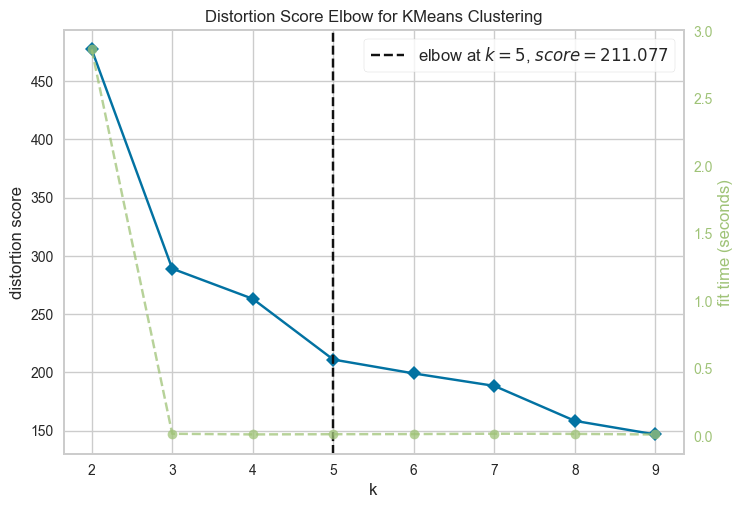

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [56]:
# Instantiate the clustering model and visualizer
km = KMeans(init="k-means++", random_state=0, n_init="auto")
visualizer = KElbowVisualizer(km, k=(2,10))
 
visualizer.fit(pca_final_df)        # Fit the data to the visualizer
visualizer.show()   


In [57]:
km = KMeans(n_clusters=5, init='k-means++', n_init=10, max_iter=200, random_state=42)
clusters_predict = km.fit_predict(pca_final_df)
print(km.inertia_)

206.578711802582


In [58]:
np.unique(clusters_predict)

array([0, 1, 2, 3, 4])

In [59]:
clusters_predict

array([1, 1, 0, ..., 1, 0, 1])

In [60]:
len(clusters_predict)

5723

In [ ]:

table_df['cluster_label']= clusters_predict

Use sum_df_normalized for seeing inference with normalized features

In [62]:

sum_df_normalized['cluster_label']=clusters_predict

Use pca_final_df for inference with principal components but change the feature names accordingly

In [63]:
pca_final_df["cluster_label"]=clusters_predict

use sum_df_1 for inference with original features

In [64]:
sum_df_1=table_df.copy()

In [65]:
sum_df_1.head()

,RETAILER_ID,AREA_CLASSIFICATION,CITY_NAME,OVERALL_NET_LANDING_PRICE,OVERALL_RET_REP_PER,OVERALL_AOV,MOM_AVG_AOV,MOM_AVG_RET_REP_PER,BILL_RATE,MOM_AVG_BILLING_FREQUENCY,REVENUE_CONTRIBUTION_AREA_WISE,MOM_AVG_REVENUE_CONTRIBUTION_AREA_WISE,cluster_label
0,1114.0,Gurgaon-GT,Gurgaon,9.565497,0.280605,2457.508088,2607.138686,0.295014,0.935484,4.689655,0.004375,0.004788,1
1,1147.0,Delhi-GT,Delhi,10.762171,0.186366,974.029592,989.483856,0.443896,1.000000,3.161290,0.001307,0.001405,1
2,2528.0,Noida-GT,Noida,12.401806,0.611738,499.454545,486.435897,0.590322,0.800000,1.692308,0.000364,0.000622,0
3,3704.0,Delhi-GT,Delhi,9.259874,0.796378,2182.521739,1725.909722,1.888977,0.916667,1.916667,0.000688,0.001398,1
4,1521.0,Delhi-GT,Delhi,8.892436,0.142434,7273.531381,7338.586361,0.142447,1.000000,7.966667,0.023809,0.025077,1


In [66]:
sum_df_1.shape

(5723, 13)

# Generate csv containing the clusters label

In [67]:
sum_df_1.to_csv("clustering_final.csv",index=False)

In [68]:
sum_df_1

,RETAILER_ID,AREA_CLASSIFICATION,CITY_NAME,OVERALL_NET_LANDING_PRICE,OVERALL_RET_REP_PER,OVERALL_AOV,MOM_AVG_AOV,MOM_AVG_RET_REP_PER,BILL_RATE,MOM_AVG_BILLING_FREQUENCY,REVENUE_CONTRIBUTION_AREA_WISE,MOM_AVG_REVENUE_CONTRIBUTION_AREA_WISE,cluster_label
0,1114.0,Gurgaon-GT,Gurgaon,9.565497,0.280605,2457.508088,2607.138686,0.295014,0.935484,4.689655,0.004375,0.004788,1
1,1147.0,Delhi-GT,Delhi,10.762171,0.186366,974.029592,989.483856,0.443896,1.000000,3.161290,0.001307,0.001405,1
2,2528.0,Noida-GT,Noida,12.401806,0.611738,499.454545,486.435897,0.590322,0.800000,1.692308,0.000364,0.000622,0
3,3704.0,Delhi-GT,Delhi,9.259874,0.796378,2182.521739,1725.909722,1.888977,0.916667,1.916667,0.000688,0.001398,1
4,1521.0,Delhi-GT,Delhi,8.892436,0.142434,7273.531381,7338.586361,0.142447,1.000000,7.966667,0.023809,0.025077,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
5718,7462.0,Gurgaon-GT,Gurgaon,11.217742,0.000000,2086.500000,2086.500000,0.000000,1.000000,1.000000,0.000027,0.000975,1
5719,8377.0,Kolkata-GT,Kolkata,12.466667,0.000000,224.400000,224.400000,0.000000,1.000000,1.000000,0.000518,0.002279,0
5720,2694.0,Gurgaon-GT,Gurgaon,9.658915,0.000000,1246.000000,1246.000000,0.000000,1.000000,1.000000,0.000016,0.000356,1
5721,8511.0,Kolkata-GT,Kolkata,12.466667,0.000000,299.200000,299.200000,0.000000,1.000000,1.000000,0.000690,0.003039,0


In [69]:
# Assuming 'cluster_label' is the column with cluster labels
cluster_counts = sum_df_1['cluster_label'].value_counts()

for cluster_label, count in cluster_counts.items():
    print(f"Cluster {cluster_label}: {count}")

Cluster 1: 2800
Cluster 0: 1240
Cluster 3: 870
Cluster 4: 494
Cluster 2: 319


In [70]:
sum_df

,AREA_CLASSIFICATION,OVERALL_NET_LANDING_PRICE,OVERALL_RET_REP_PER,OVERALL_AOV,MOM_AVG_AOV,MOM_AVG_RET_REP_PER,BILL_RATE,MOM_AVG_BILLING_FREQUENCY,REVENUE_CONTRIBUTION_AREA_WISE,MOM_AVG_REVENUE_CONTRIBUTION_AREA_WISE
0,0,9.565497,0.280605,2457.508088,2607.138686,0.295014,0.935484,4.689655,0.004375,0.004788
1,2,10.762171,0.186366,974.029592,989.483856,0.443896,1.000000,3.161290,0.001307,0.001405
2,5,12.401806,0.611738,499.454545,486.435897,0.590322,0.800000,1.692308,0.000364,0.000622
3,2,9.259874,0.796378,2182.521739,1725.909722,1.888977,0.916667,1.916667,0.000688,0.001398
4,2,8.892436,0.142434,7273.531381,7338.586361,0.142447,1.000000,7.966667,0.023809,0.025077
...,...,...,...,...,...,...,...,...,...,...
5718,0,11.217742,0.000000,2086.500000,2086.500000,0.000000,1.000000,1.000000,0.000027,0.000975
5719,8,12.466667,0.000000,224.400000,224.400000,0.000000,1.000000,1.000000,0.000518,0.002279
5720,0,9.658915,0.000000,1246.000000,1246.000000,0.000000,1.000000,1.000000,0.000016,0.000356
5721,8,12.466667,0.000000,299.200000,299.200000,0.000000,1.000000,1.000000,0.000690,0.003039


In [71]:
from sklearn.metrics import silhouette_score
from sklearn.metrics import calinski_harabasz_score
from sklearn.metrics import davies_bouldin_score

"""
The Davies Bouldin index is defined as the average similarity measure of each cluster with its most similar cluster, where similarity is the ratio of within-cluster distances to between-cluster distances.
The minimum value of the DB Index is 0, whereas a smaller value (closer to 0) represents a better model that produces better clusters.
"""
print(f"Davies bouldin score: {davies_bouldin_score(sum_df_normalized,clusters_predict)}")

"""
Calinski Harabaz Index -> Variance Ratio Criterion.
Calinski Harabaz Index is defined as the ratio of the sum of between-cluster dispersion and of within-cluster dispersion.
The higher the index the more separable the clusters.
"""
print(f"Calinski Score: {calinski_harabasz_score(sum_df_normalized,clusters_predict)}")

"""
The silhouette score is a metric used to calculate the goodness of fit of a clustering algorithm, but can also be used as a method for determining an optimal value of k (see here for more).
Its value ranges from -1 to 1.
A value of 0 indicates clusters are overlapping and either the data or the value of k is incorrect.
1 is the ideal value and indicates that clusters are very dense and nicely separated.
"""
print(f"Silhouette Score: {silhouette_score(sum_df_normalized,clusters_predict)}")

Davies bouldin score: 0.3455347410771902
Calinski Score: 59085.82537550073
Silhouette Score: 0.7837404362848288


In [72]:
sum_df_1.columns

Index(['RETAILER_ID', 'AREA_CLASSIFICATION', 'CITY_NAME',
       'OVERALL_NET_LANDING_PRICE', 'OVERALL_RET_REP_PER', 'OVERALL_AOV',
       'MOM_AVG_AOV', 'MOM_AVG_RET_REP_PER', 'BILL_RATE',
       'MOM_AVG_BILLING_FREQUENCY', 'REVENUE_CONTRIBUTION_AREA_WISE',
       'MOM_AVG_REVENUE_CONTRIBUTION_AREA_WISE', 'cluster_label'],
      dtype='object')

## Inference from the clusters

In [73]:
import pandas as pd
import plotly.express as px

# Assuming sum_df is your DataFrame
fig = px.scatter(sum_df_normalized, x='BILL_RATE', y='MOM_AVG_BILLING_FREQUENCY', color='cluster_label', labels={'MOM_AVG_BILLING_FREQUENCY': 'MOM_AVG_BILLING_FREQUENCY'})

# Add axis labels and title
fig.update_layout(
    xaxis_title='BILL_RATE',
    yaxis_title='MOM_AVG_BILLING_FREQUENCY', 
    title='Interactive 2D Plot with Cluster Index'
)

# Show the interactive plot
fig.show()


In [74]:
import pandas as pd
import plotly.express as px

# Assuming sum_df is your DataFrame
fig = px.scatter(sum_df_normalized, x='MOM_AVG_AOV', y='MOM_AVG_RET_REP_PER', color='cluster_label', labels={'MOM_AVG_RET_REP_PER': 'MOM_AVG_RET_REP_PER'})

# Add axis labels and title
fig.update_layout(
    xaxis_title='MOM_AVG_AOV',
    yaxis_title='MOM_AVG_RET_REP_PER',
    title='Interactive 2D Plot with Cluster Index'
)

# Show the interactive plot
fig.show()


In [75]:
sum_df_1.columns

Index(['RETAILER_ID', 'AREA_CLASSIFICATION', 'CITY_NAME',
       'OVERALL_NET_LANDING_PRICE', 'OVERALL_RET_REP_PER', 'OVERALL_AOV',
       'MOM_AVG_AOV', 'MOM_AVG_RET_REP_PER', 'BILL_RATE',
       'MOM_AVG_BILLING_FREQUENCY', 'REVENUE_CONTRIBUTION_AREA_WISE',
       'MOM_AVG_REVENUE_CONTRIBUTION_AREA_WISE', 'cluster_label'],
      dtype='object')

In [76]:
import pandas as pd
import plotly.express as px

# Assuming sum_df is your DataFrame
fig = px.scatter(sum_df_normalized, x='OVERALL_NET_LANDING_PRICE', y='MOM_AVG_BILLING_FREQUENCY', color='cluster_label', labels={'MOM_AVG_BILLING_FREQUENCY': 'MOM_AVG_BILLING_FREQUENCY'})

# Add axis labels and title
fig.update_layout(
    xaxis_title='OVERALL_NET_LANDING_PRICE',
    yaxis_title='MOM_AVG_BILLING_FREQUENCY', 
    title='Interactive 2D Plot with Cluster Index'
)

# Show the interactive plot
fig.show()

In [77]:
import pandas as pd
import plotly.express as px

# Assuming sum_df is your DataFrame
fig = px.scatter(sum_df_normalized, x='OVERALL_NET_LANDING_PRICE', y='OVERALL_RET_REP_PER', color='cluster_label', labels={'OVERALL_RET_REP_PER': 'OVERALL_RET_REP_PER'})

# Add axis labels and title
fig.update_layout(
    xaxis_title='OVERALL_NET_LANDING_PRICE',
    yaxis_title='OVERALL_RET_REP_PER',
    title='Interactive 2D Plot with Cluster Index'
)


# Show the interactive plot
fig.show()


In [395]:
sum_df_1.columns

Index(['RETAILER_ID', 'AREA_CLASSIFICATION', 'CITY_NAME',
       'OVERALL_NET_LANDING_PRICE', 'OVERALL_RET_REP_PER', 'OVERALL_AOV',
       'MOM_AVG_AOV', 'MOM_AVG_RET_REP_PER', 'BILL_RATE',
       'MOM_AVG_BILLING_FREQUENCY', 'REVENUE_CONTRIBUTION_AREA_WISE',
       'MOM_AVG_REVENUE_CONTRIBUTION_AREA_WISE', 'cluster_label'],
      dtype='object')

In [78]:
import pandas as pd
import plotly.express as px

# Assuming sum_df is your DataFrame
fig = px.scatter(sum_df_normalized, x='REVENUE_CONTRIBUTION_AREA_WISE', y='MOM_AVG_REVENUE_CONTRIBUTION_AREA_WISE', color='cluster_label', labels={'MOM_AVG_REVENUE_CONTRIBUTION_AREA_WISE': 'MOM_AVG_REVENUE_CONTRIBUTION_AREA_WISE'})

# Add axis labels and title
fig.update_layout(
    xaxis_title='REVENUE_CONTRIBUTION_AREA_WISE',
    yaxis_title='MOM_AVG_REVENUE_CONTRIBUTION_AREA_WISE',
    title='Interactive 2D Plot with Cluster Index'
)

# Show the interactive plot
fig.show()


In [79]:
table_df.columns

Index(['RETAILER_ID', 'AREA_CLASSIFICATION', 'CITY_NAME',
       'OVERALL_NET_LANDING_PRICE', 'OVERALL_RET_REP_PER', 'OVERALL_AOV',
       'MOM_AVG_AOV', 'MOM_AVG_RET_REP_PER', 'BILL_RATE',
       'MOM_AVG_BILLING_FREQUENCY', 'REVENUE_CONTRIBUTION_AREA_WISE',
       'MOM_AVG_REVENUE_CONTRIBUTION_AREA_WISE', 'cluster_label'],
      dtype='object')

In [80]:

# Violin plot for each feature colored by cluster labels
violin_fig = px.violin(sum_df_normalized, y='REVENUE_CONTRIBUTION_AREA_WISE', x='cluster_label', box=True, points="all", title='Violin Plot of Feature1 by Cluster Labels')
violin_fig.update_layout(xaxis_title='Cluster Label', yaxis_title='REVENUE_CONTRIBUTION_AREA_WISE')
violin_fig.show()

In [81]:
# Violin plot for each feature colored by cluster labels
violin_fig = px.violin(sum_df_normalized, y='OVERALL_NET_LANDING_PRICE', x='cluster_label', box=True, points="all", title='Violin Plot of Feature1 by Cluster Labels')
violin_fig.update_layout(xaxis_title='Cluster Label', yaxis_title='OVERALL_NET_LANDING_PRICE')
violin_fig.show()

In [82]:
# Violin plot for each feature colored by cluster labels
violin_fig = px.violin(sum_df_normalized, y='OVERALL_RET_REP_PER', x='cluster_label', box=True, points="all", title='Violin Plot of Feature1 by Cluster Labels')
violin_fig.update_layout(xaxis_title='Cluster Label', yaxis_title='OVERALL_RET_REP_PER')
violin_fig.show()

In [398]:
# Violin plot for each feature colored by cluster labels
violin_fig = px.violin(table_df, y='OVERALL_AOV', x='cluster_label', box=True, points="all", title='Violin Plot of Feature1 by Cluster Labels')
violin_fig.update_layout(xaxis_title='Cluster Label', yaxis_title='OVERALL_AOV')
violin_fig.show()

In [83]:
# Violin plot for each feature colored by cluster labels
violin_fig = px.violin(sum_df_normalized, y='MOM_AVG_AOV', x='cluster_label', box=True, points="all", title='Violin Plot of Feature1 by Cluster Labels')
violin_fig.update_layout(xaxis_title='Cluster Label', yaxis_title='MOM_AVG_AOV')
violin_fig.show()

In [89]:
# Violin plot for each feature colored by cluster labels
violin_fig = px.violin(sum_df_normalized, y='MOM_AVG_REVENUE_CONTRIBUTION_AREA_WISE', x='cluster_label', box=True, points="all", title='Violin Plot of Feature1 by Cluster Labels')
violin_fig.update_layout(xaxis_title='Cluster Label', yaxis_title='MOM_AVG_REVENUE_CONTRIBUTION_AREA_WISE')
violin_fig.show()

In [84]:

# Violin plot for each feature colored by cluster labels
violin_fig = px.violin(sum_df_normalized, y='MOM_AVG_BILLING_FREQUENCY', x='cluster_label', box=True, points="all", title='Violin Plot of Feature1 by Cluster Labels')
violin_fig.update_layout(xaxis_title='Cluster Label', yaxis_title='MOM_AVG_BILLING_FREQUENCY')
violin_fig.show()

In [85]:
# Choose a feature for deviation curve
selected_feature = 'OVERALL_NET_LANDING_PRICE'

# Calculate ECDF of the selected feature
x_values = np.sort(table_df[selected_feature])
y_values = np.arange(1, len(x_values) + 1) / len(x_values)

# Calculate CDF of a normal distribution with the same mean and standard deviation as the selected feature
mu, sigma = table_df[selected_feature].mean(), table_df[selected_feature].std()
normal_cdf = stats.norm.cdf(x_values, mu, sigma)

# Create deviation curve plot
fig = px.line(x=x_values, y=y_values, labels={'x': selected_feature, 'y': 'Cumulative Probability'},
              title=f'Deviation Curve for {selected_feature} from Normal Distribution')
fig.add_scatter(x=x_values, y=normal_cdf, mode='lines', name='Normal Distribution', line=dict(dash='dash'))
fig.show()


In [86]:
table_df.columns

Index(['RETAILER_ID', 'AREA_CLASSIFICATION', 'CITY_NAME',
       'OVERALL_NET_LANDING_PRICE', 'OVERALL_RET_REP_PER', 'OVERALL_AOV',
       'MOM_AVG_AOV', 'MOM_AVG_RET_REP_PER', 'BILL_RATE',
       'MOM_AVG_BILLING_FREQUENCY', 'REVENUE_CONTRIBUTION_AREA_WISE',
       'MOM_AVG_REVENUE_CONTRIBUTION_AREA_WISE', 'cluster_label'],
      dtype='object')

Removing Area classification column in table_df_1

In [87]:
table_df_1= table_df[[
       'OVERALL_NET_LANDING_PRICE', 'OVERALL_RET_REP_PER', 'OVERALL_AOV',
       'MOM_AVG_AOV', 'MOM_AVG_RET_REP_PER', 'BILL_RATE',
       'MOM_AVG_BILLING_FREQUENCY', 'REVENUE_CONTRIBUTION_AREA_WISE',
       'MOM_AVG_REVENUE_CONTRIBUTION_AREA_WISE', 'cluster_label']]

# Histograms with Normal Distribution Overlay before normalization:

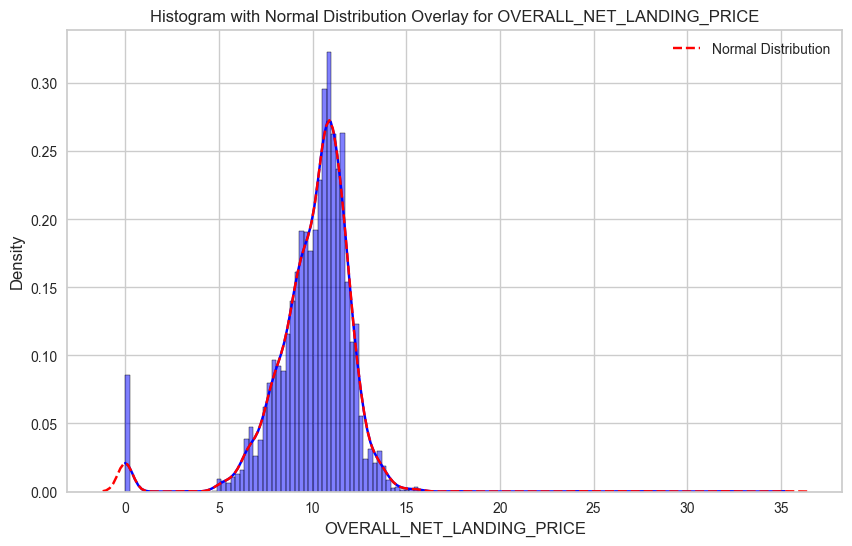

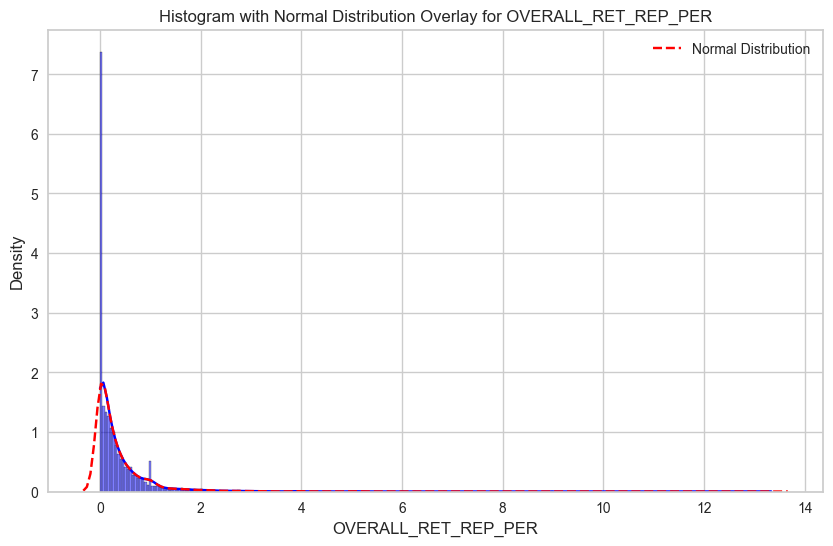

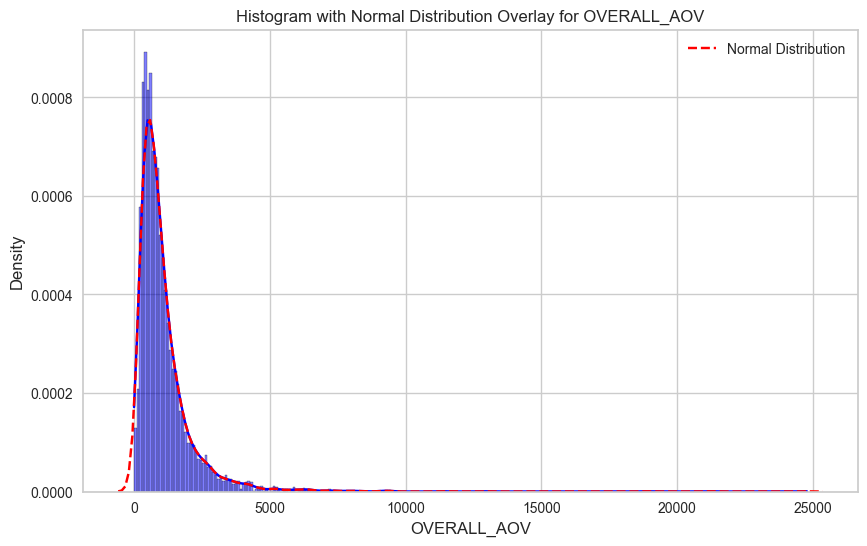

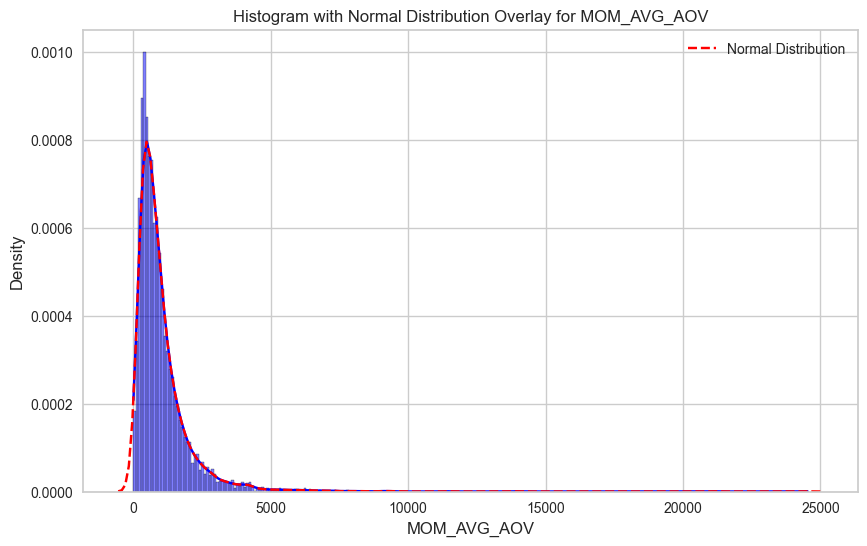

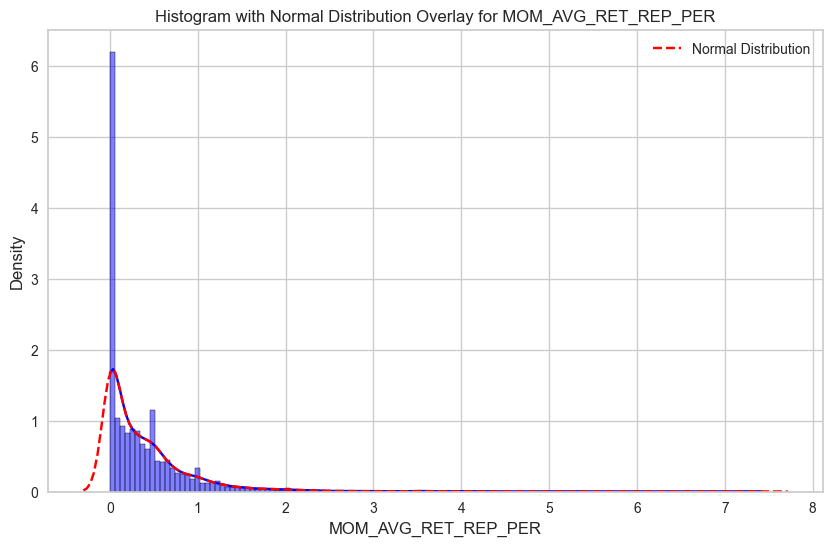

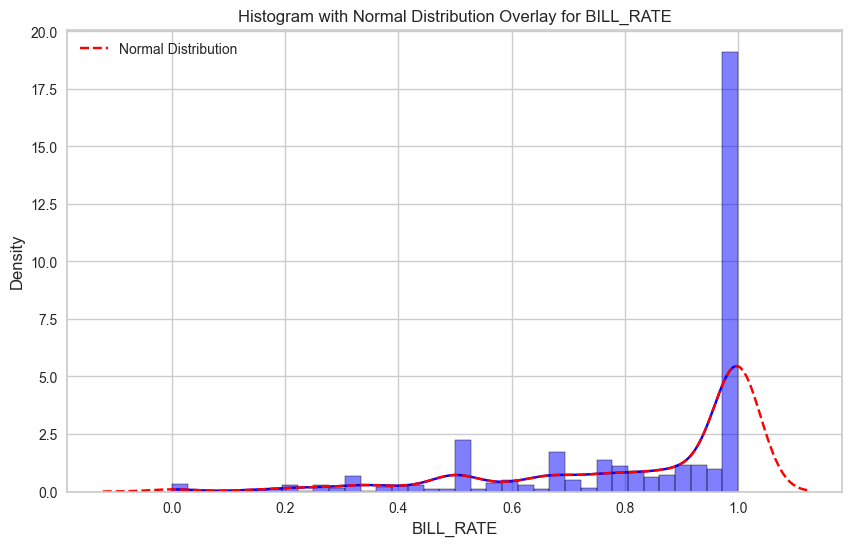

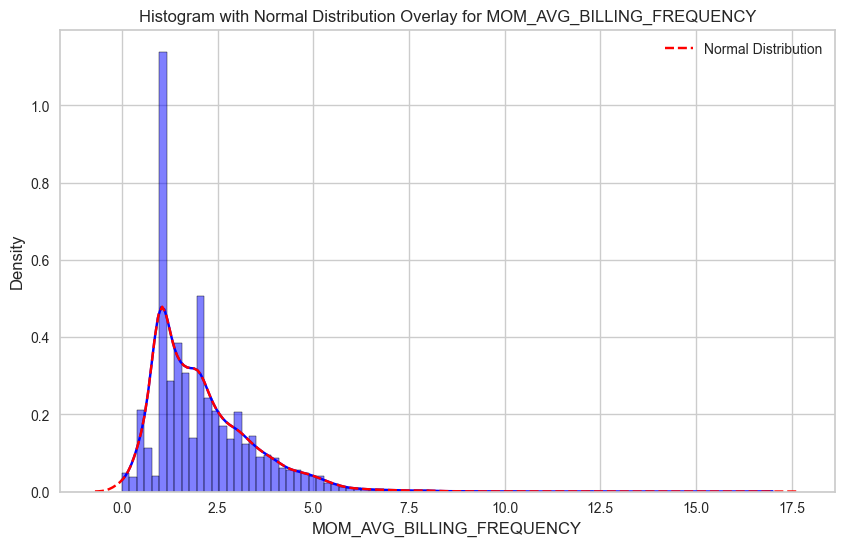

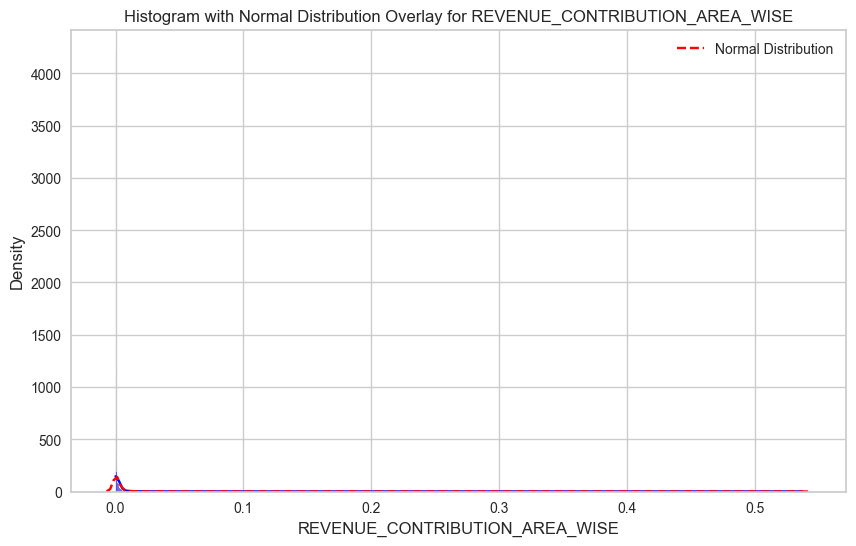

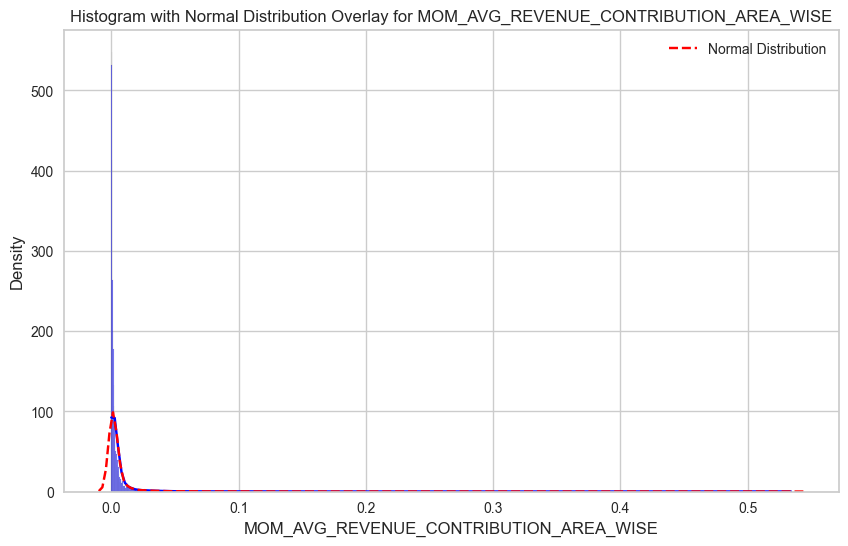

In [405]:
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming 'table_df' is your DataFrame with columns: feature1, feature2, ..., feature7

for feature in table_df_1.columns[:-1]:
    plt.figure(figsize=(10, 6))
    sns.histplot(table_df_1[feature], kde=True, color='blue', stat='density')
    plt.title(f'Histogram with Normal Distribution Overlay for {feature}')
    sns.kdeplot(table_df_1[feature], color='red', linestyle='--', label='Normal Distribution')
    plt.legend()
    plt.show()


# Histograms with Normal Distribution Overlay before normalization:

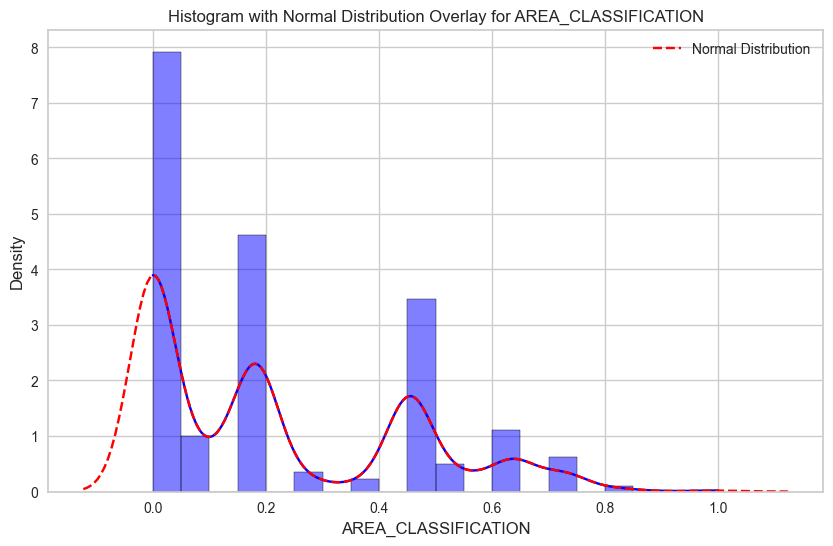

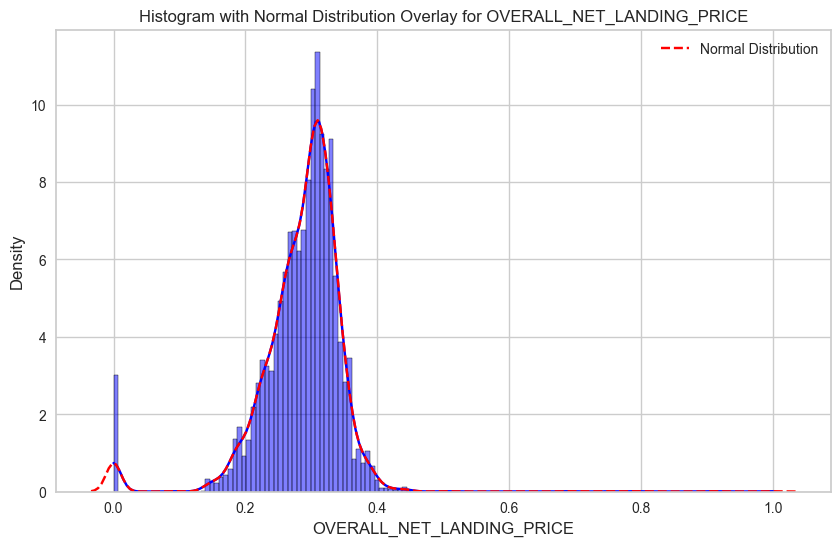

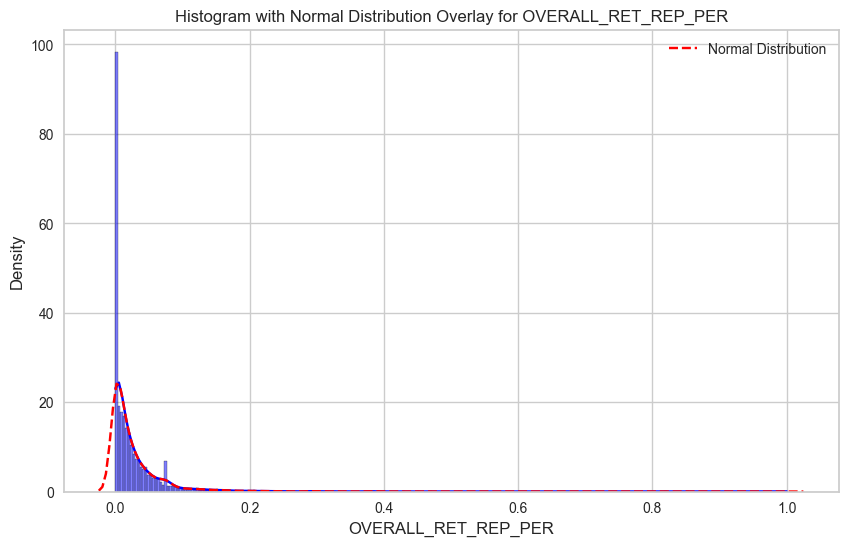

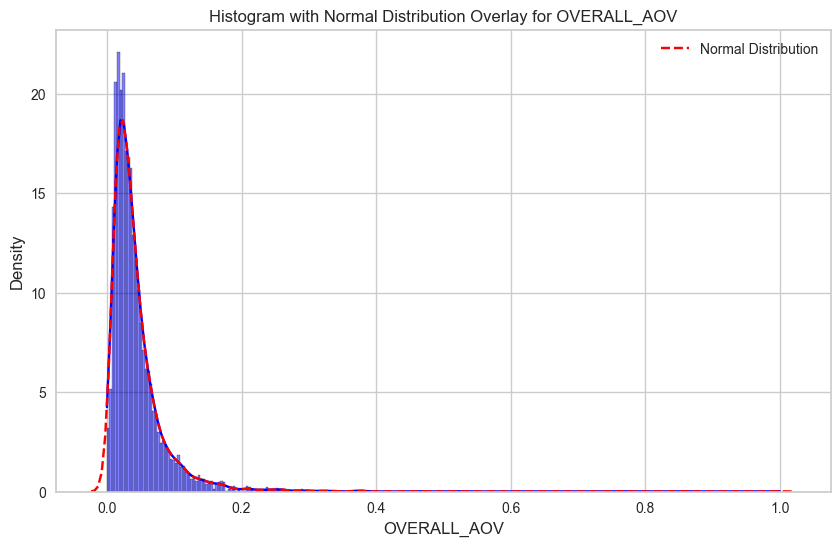

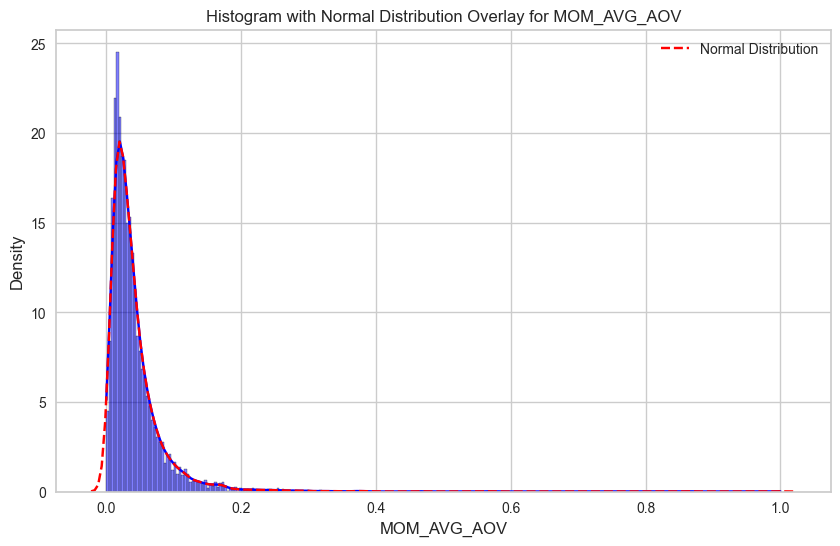

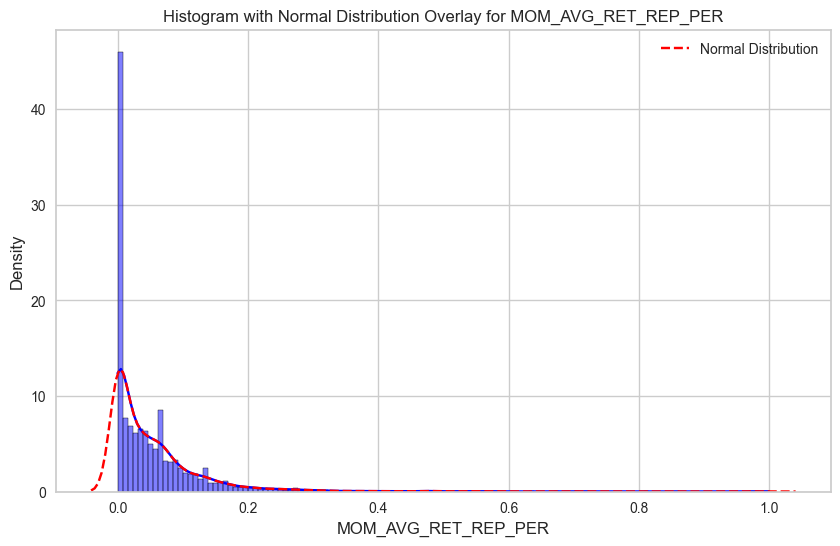

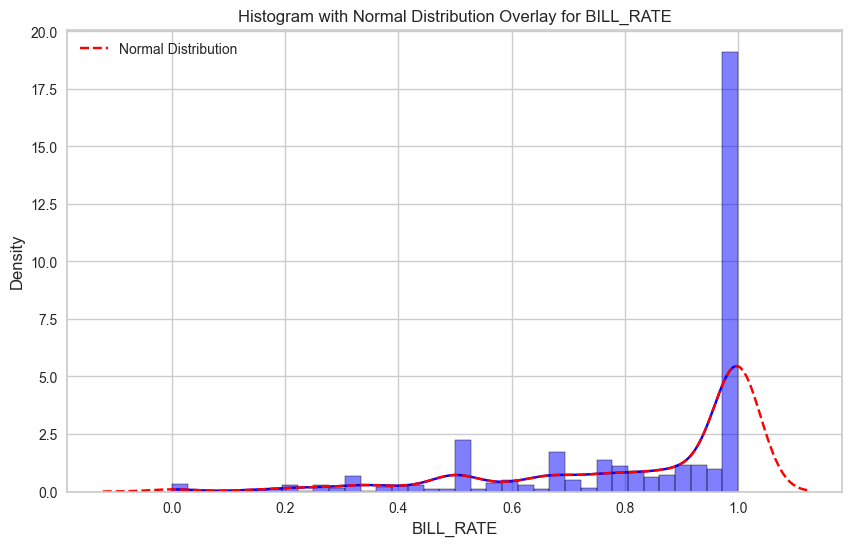

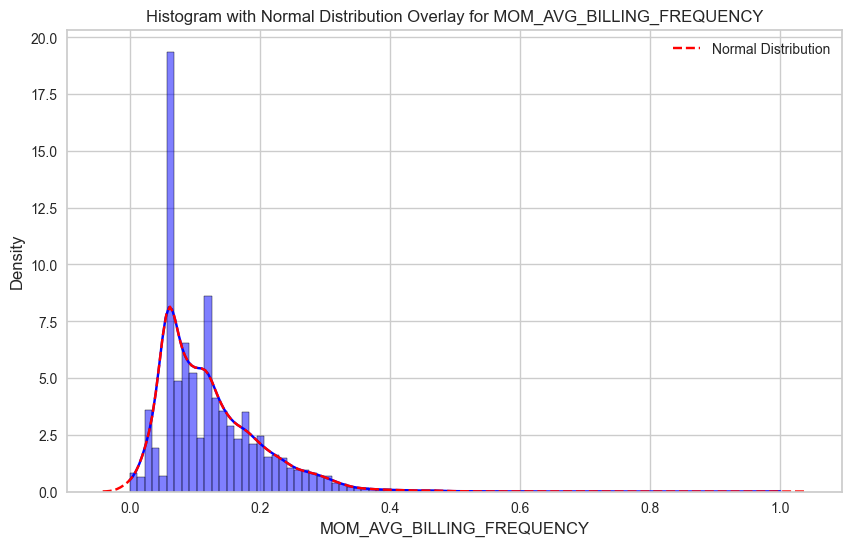

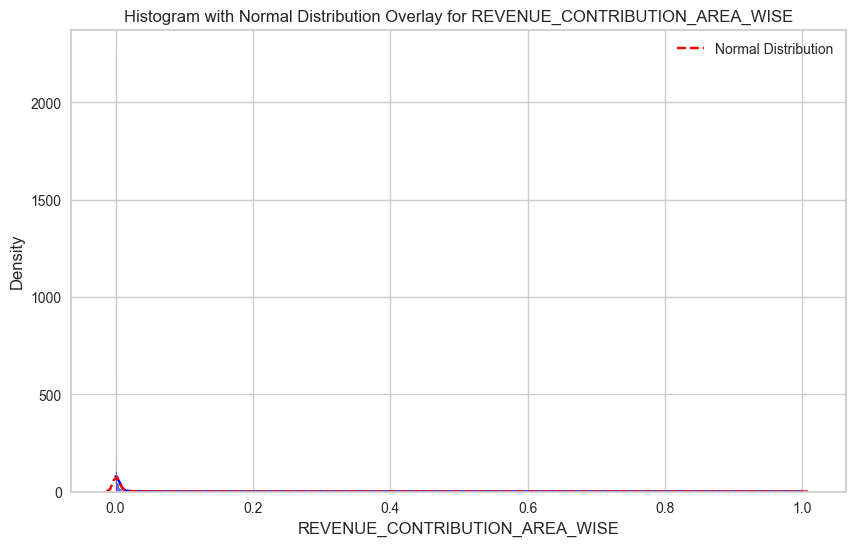

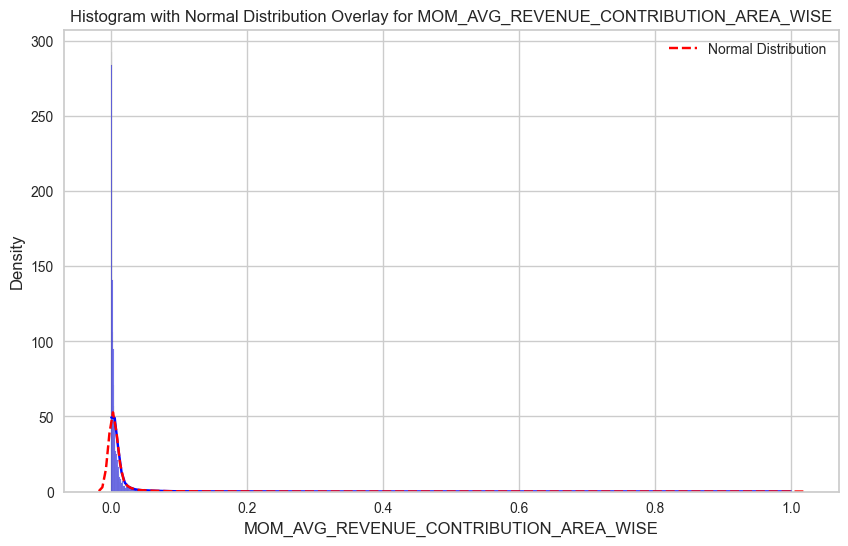

In [90]:
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming 'table_df' is your DataFrame with columns: feature1, feature2, ..., feature7

for feature in sum_df_normalized.columns[:-1]:
    plt.figure(figsize=(10, 6))
    sns.histplot(sum_df_normalized[feature], kde=True, color='blue', stat='density')
    plt.title(f'Histogram with Normal Distribution Overlay for {feature}')
    sns.kdeplot(sum_df_normalized[feature], color='red', linestyle='--', label='Normal Distribution')
    plt.legend()
    plt.show()


# Q-Q Quantile plots

<Figure size 800x800 with 0 Axes>

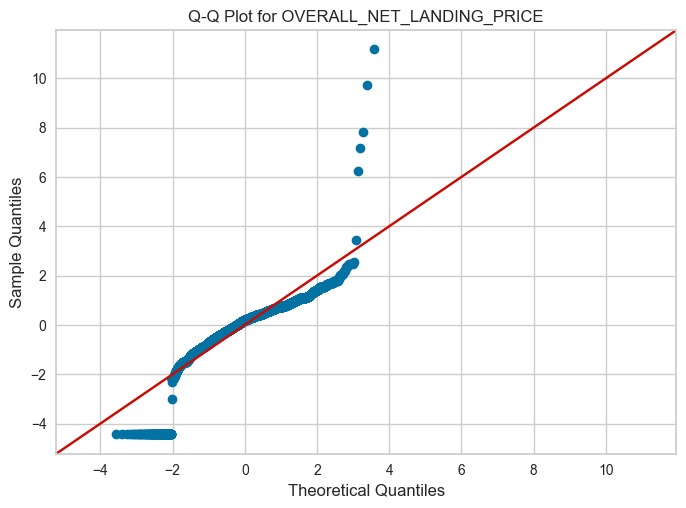

<Figure size 800x800 with 0 Axes>

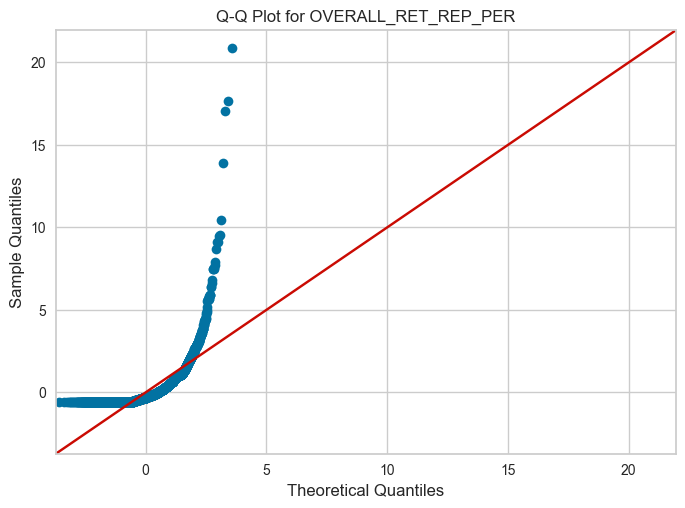

<Figure size 800x800 with 0 Axes>

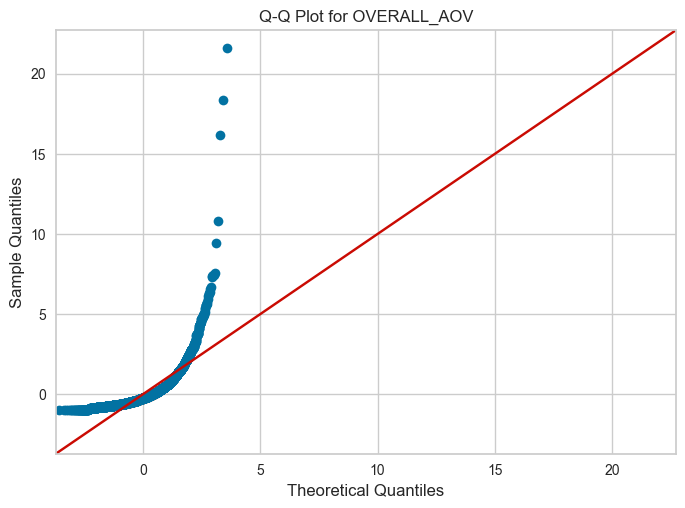

<Figure size 800x800 with 0 Axes>

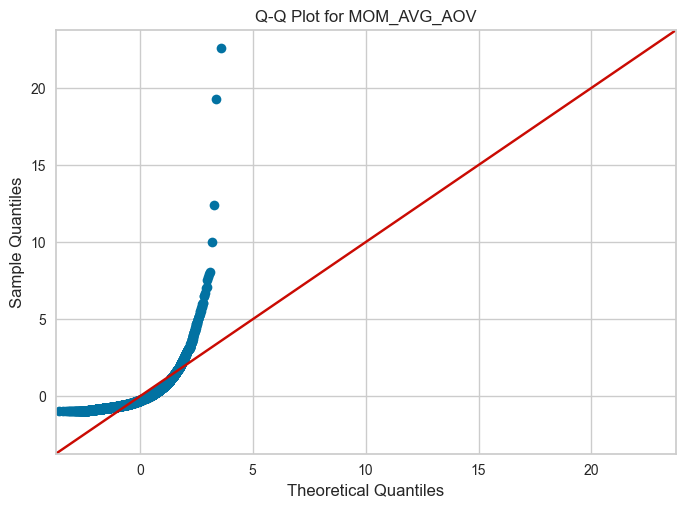

<Figure size 800x800 with 0 Axes>

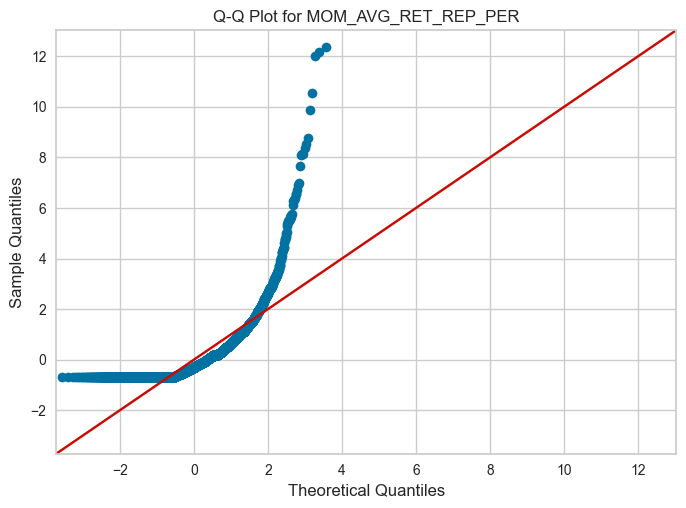

<Figure size 800x800 with 0 Axes>

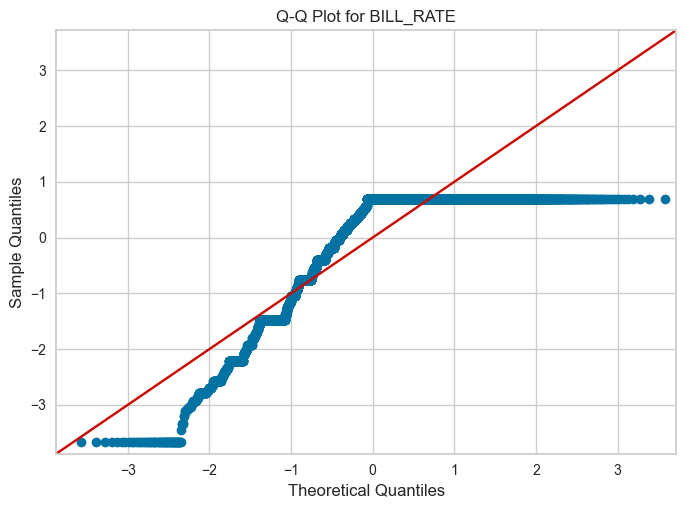

<Figure size 800x800 with 0 Axes>

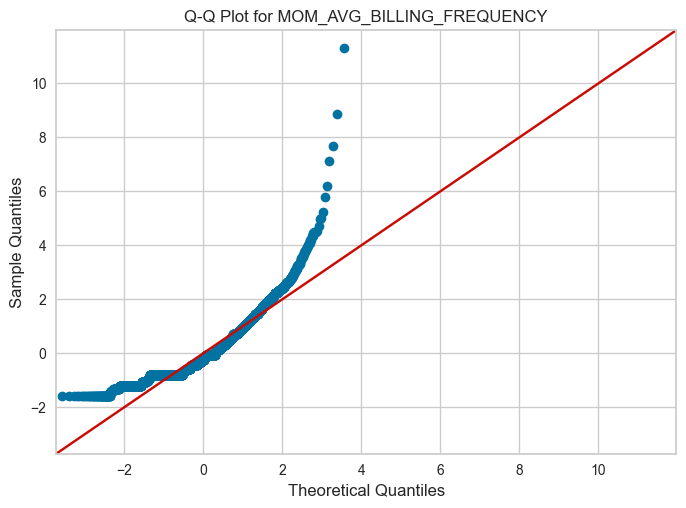

<Figure size 800x800 with 0 Axes>

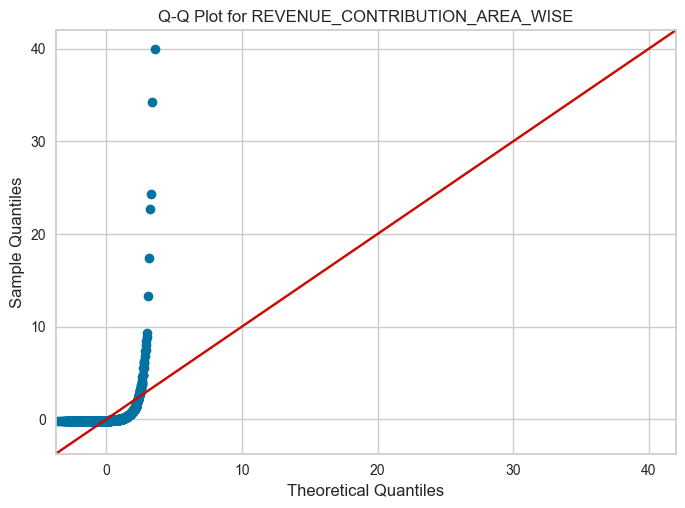

<Figure size 800x800 with 0 Axes>

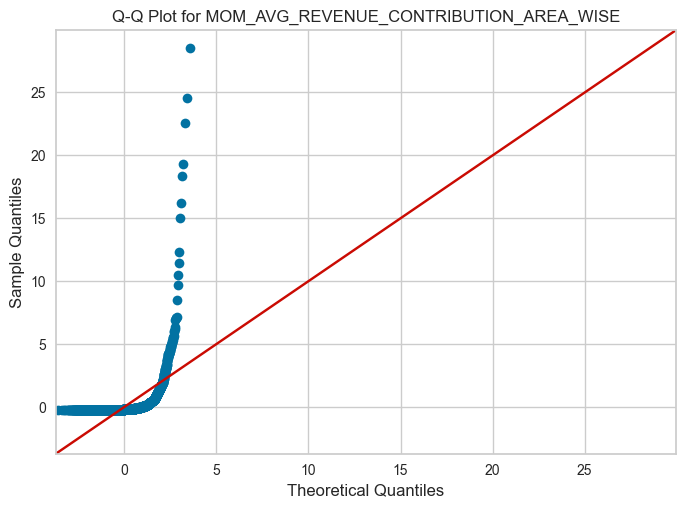

In [284]:
import statsmodels.api as sm

# Assuming 'table_df' is your DataFrame with columns: feature1, feature2, ..., feature7

for feature in table_df_1.columns[:-1]:
    plt.figure(figsize=(8, 8))
    sm.qqplot(table_df_1[feature], line='45', fit=True)
    plt.title(f'Q-Q Plot for {feature}')
    plt.show()


# Q-Q Plots after normalization

<Figure size 800x800 with 0 Axes>

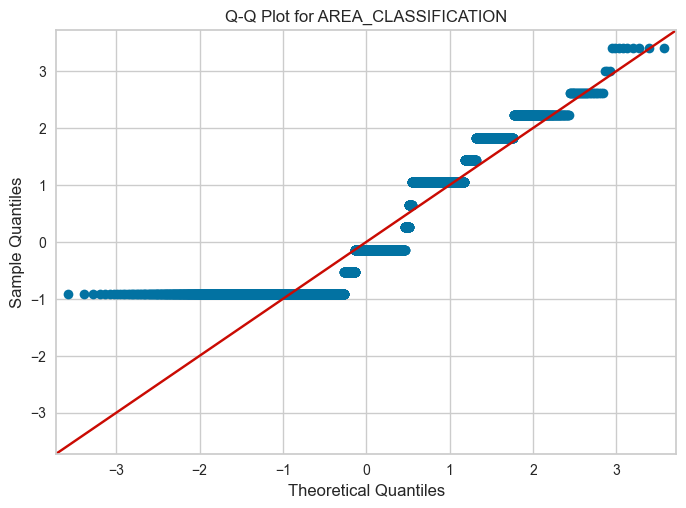

<Figure size 800x800 with 0 Axes>

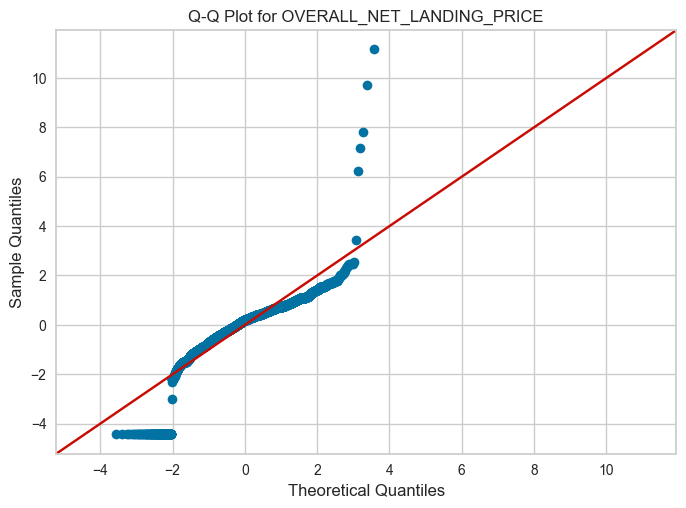

<Figure size 800x800 with 0 Axes>

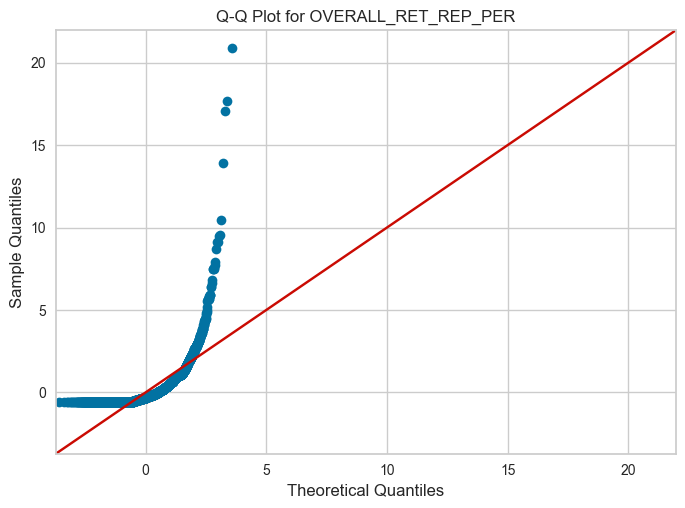

<Figure size 800x800 with 0 Axes>

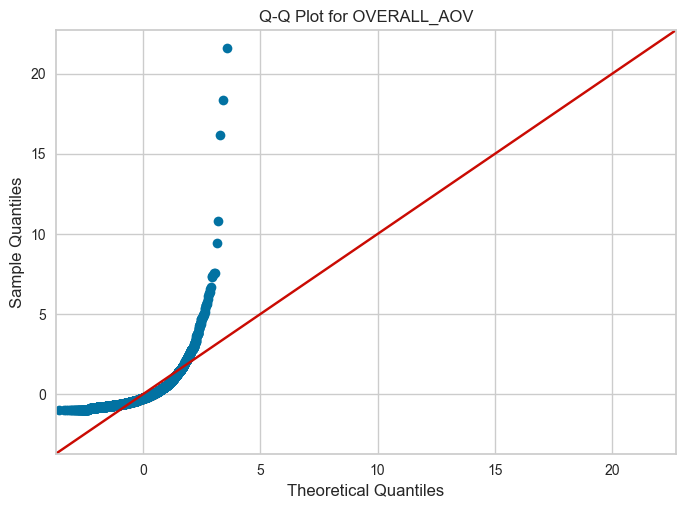

<Figure size 800x800 with 0 Axes>

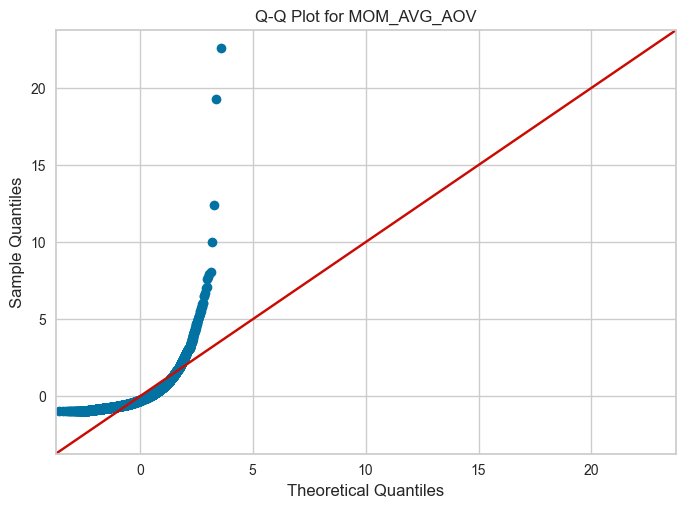

<Figure size 800x800 with 0 Axes>

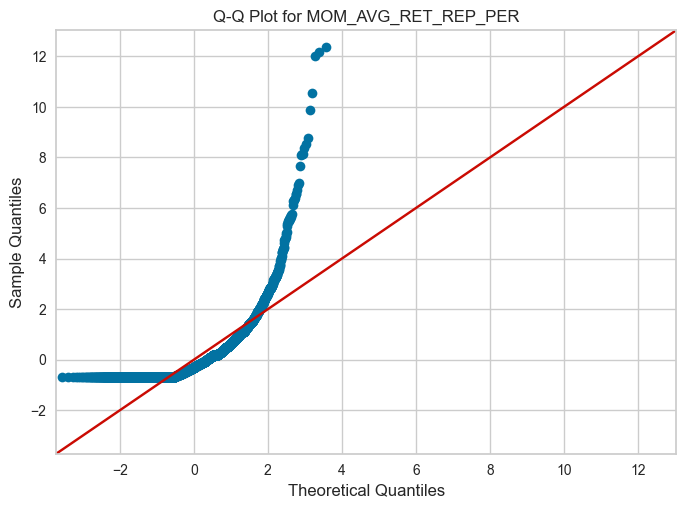

<Figure size 800x800 with 0 Axes>

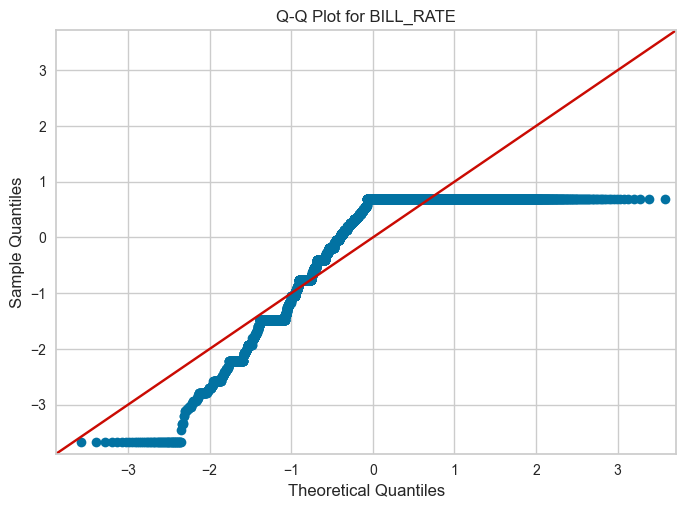

<Figure size 800x800 with 0 Axes>

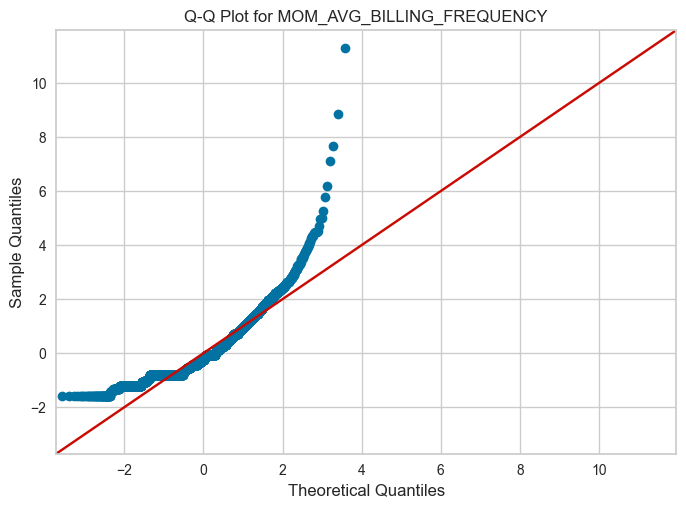

<Figure size 800x800 with 0 Axes>

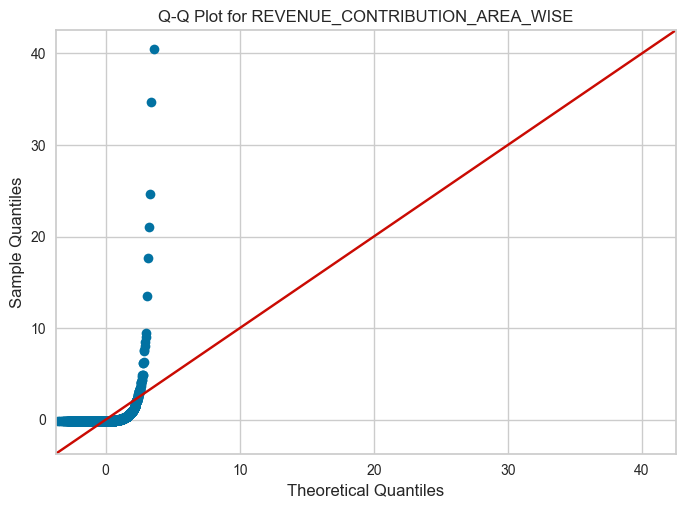

<Figure size 800x800 with 0 Axes>

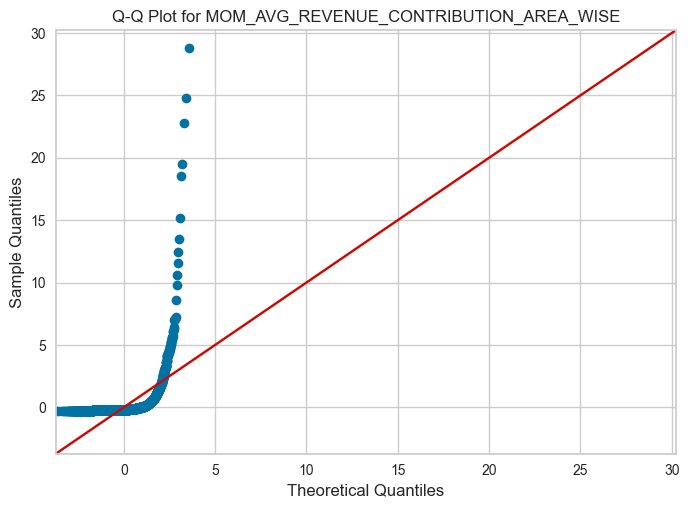

In [91]:
import statsmodels.api as sm

# Assuming 'table_df' is your DataFrame with columns: feature1, feature2, ..., feature7

for feature in sum_df_normalized.columns[:-1]:
    plt.figure(figsize=(8, 8))
    sm.qqplot(sum_df_normalized[feature], line='45', fit=True)
    plt.title(f'Q-Q Plot for {feature}')
    plt.show()

# Shapiro-Wilk Test:

In [92]:
from scipy.stats import shapiro

# Assuming 'table_df' is your DataFrame with columns: feature1, feature2, ..., feature7

for feature in table_df_1.columns[:-1]:
    stat, p_value = shapiro(table_df_1[feature])
    print(f'Shapiro-Wilk test for {feature}: Statistic={stat}, p-value={p_value}')


Shapiro-Wilk test for OVERALL_NET_LANDING_PRICE: Statistic=0.8270903825759888, p-value=0.0
Shapiro-Wilk test for OVERALL_RET_REP_PER: Statistic=0.5277107954025269, p-value=0.0
Shapiro-Wilk test for OVERALL_AOV: Statistic=0.6308718323707581, p-value=0.0
Shapiro-Wilk test for MOM_AVG_AOV: Statistic=0.6407508850097656, p-value=0.0
Shapiro-Wilk test for MOM_AVG_RET_REP_PER: Statistic=0.6568458080291748, p-value=0.0
Shapiro-Wilk test for BILL_RATE: Statistic=0.7317667007446289, p-value=0.0
Shapiro-Wilk test for MOM_AVG_BILLING_FREQUENCY: Statistic=0.8812899589538574, p-value=0.0
Shapiro-Wilk test for REVENUE_CONTRIBUTION_AREA_WISE: Statistic=0.10921931266784668, p-value=0.0
Shapiro-Wilk test for MOM_AVG_REVENUE_CONTRIBUTION_AREA_WISE: Statistic=0.20743757486343384, p-value=0.0


C:\Users\User\AppData\Roaming\Python\Python310\site-packages\scipy\stats\_morestats.py:1816: UserWarning:

p-value may not be accurate for N > 5000.



# Distrbution plots based on clusters

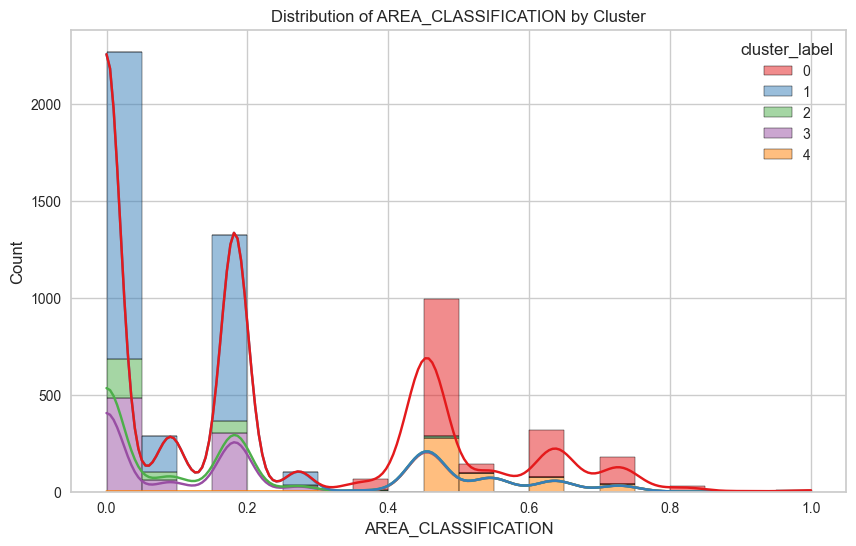

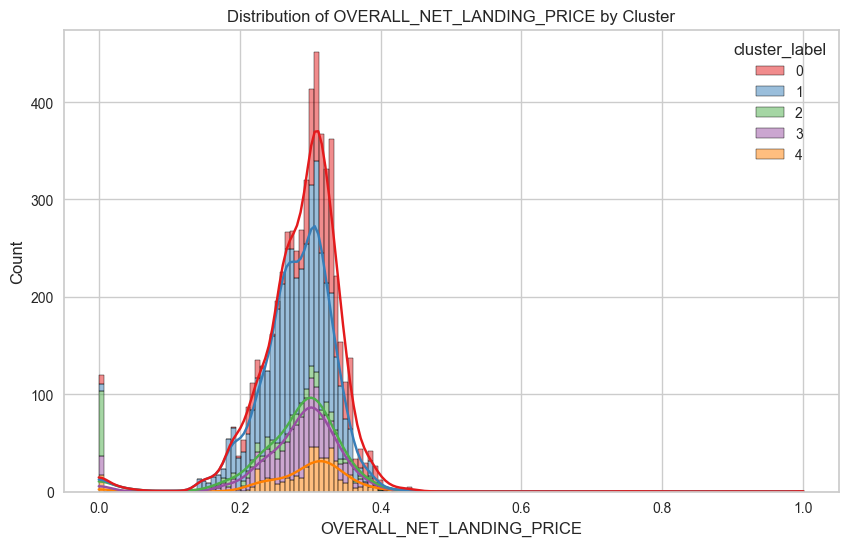

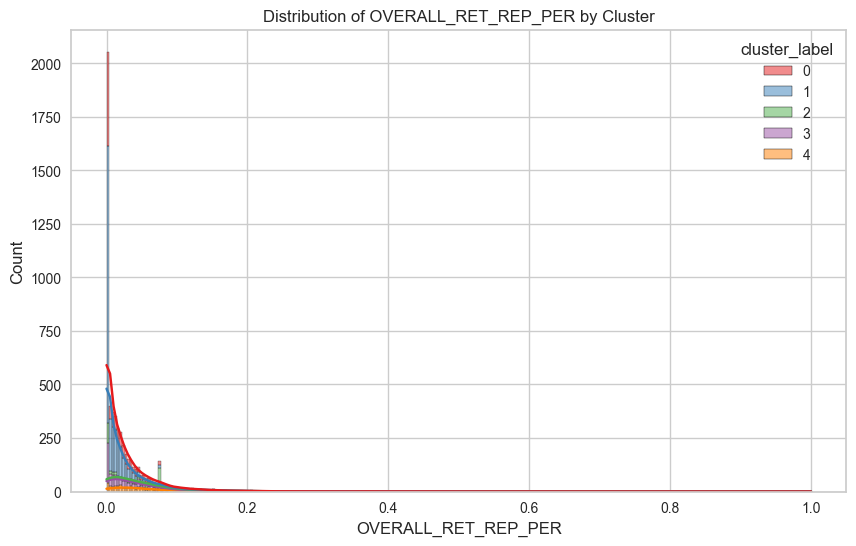

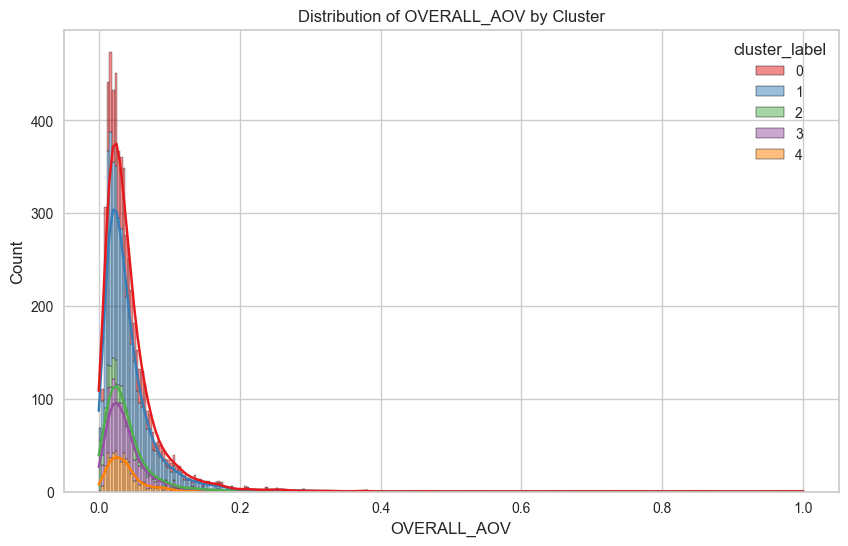

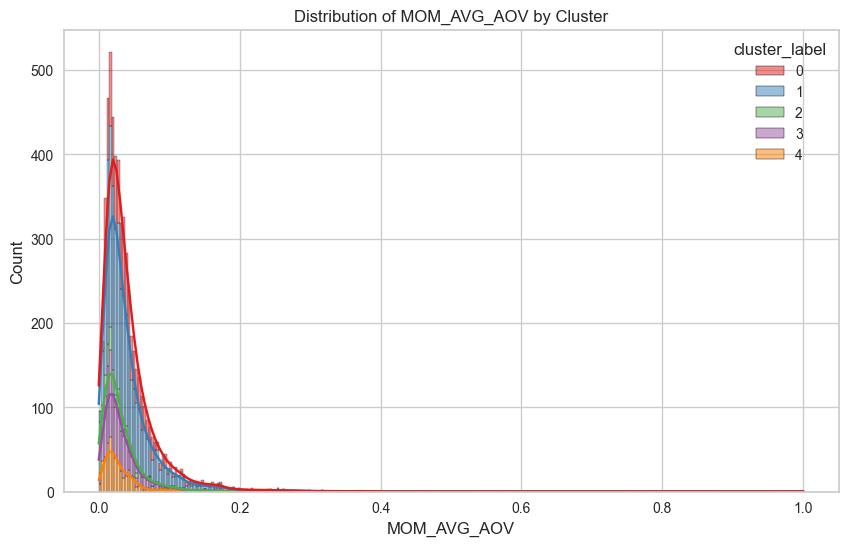

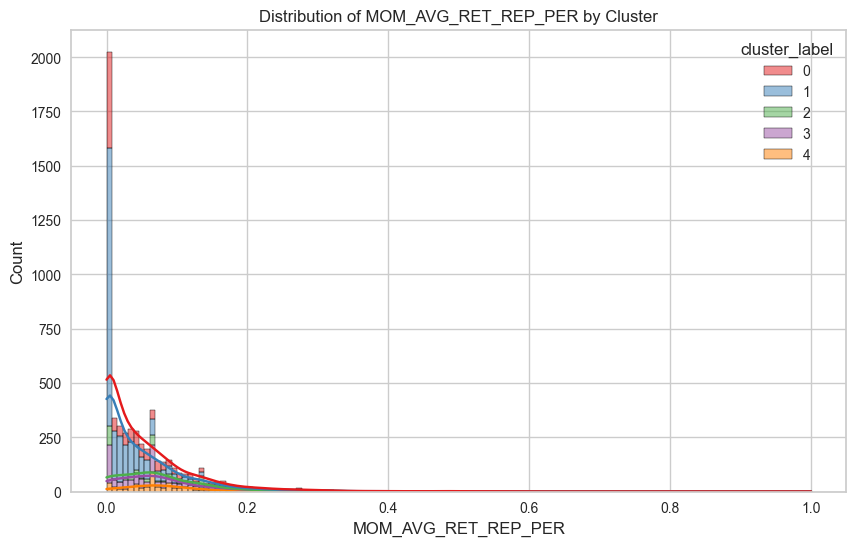

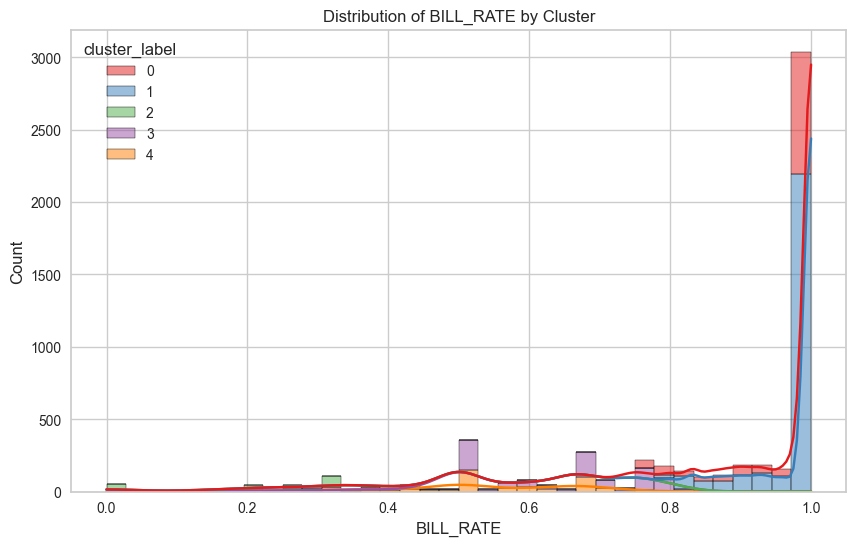

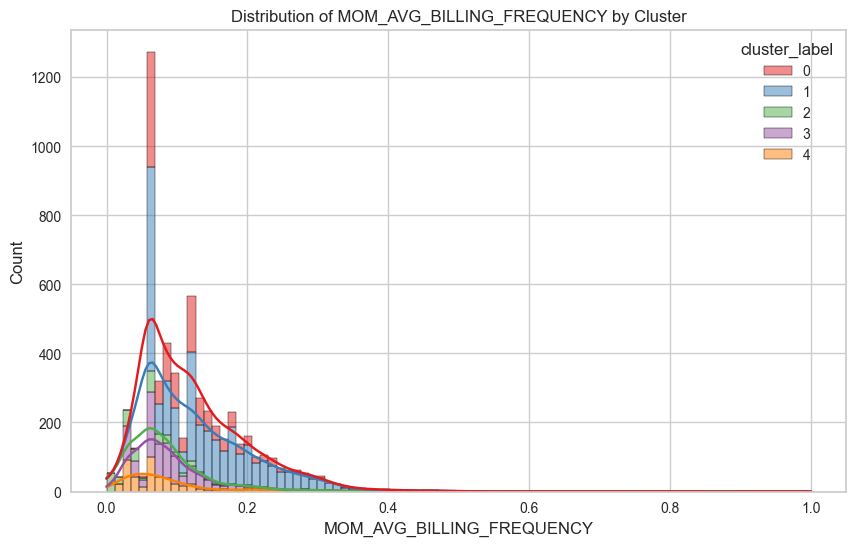

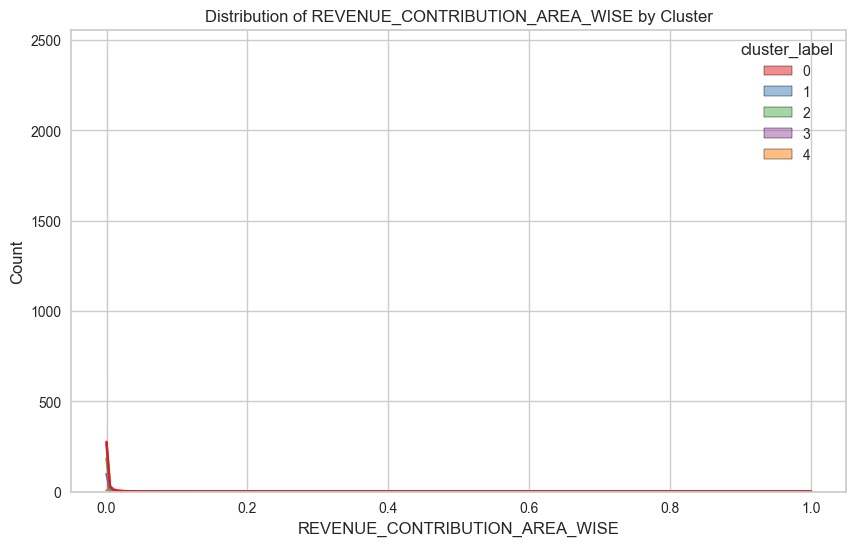

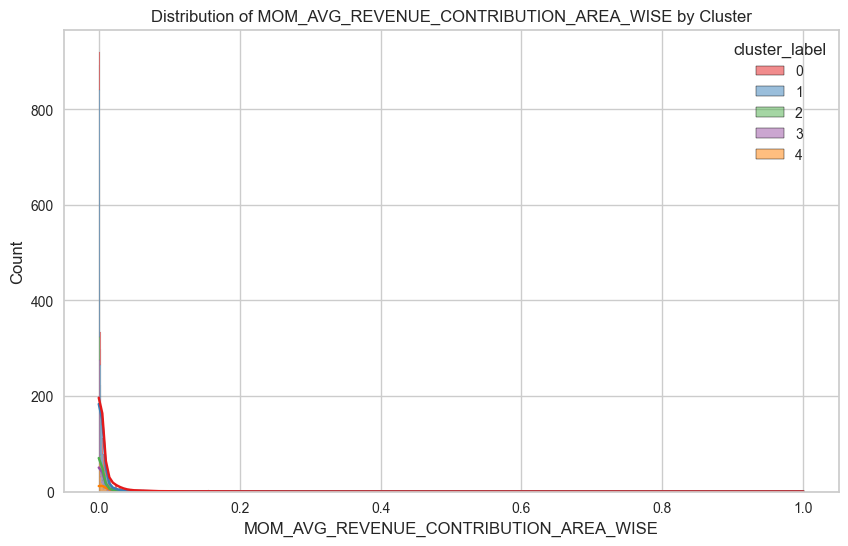

In [93]:

# Assuming 'df' is your DataFrame with columns: feature1, feature2, ..., feature7, cluster_label
for feature in sum_df_normalized.columns[:-1]:
    plt.figure(figsize=(10, 6))
    sns.histplot(sum_df_normalized, x=feature, hue='cluster_label', kde=True, multiple='stack', palette='Set1')
    plt.title(f'Distribution of {feature} by Cluster')
    plt.show()


# Pair Plot with Hue with normalized data:

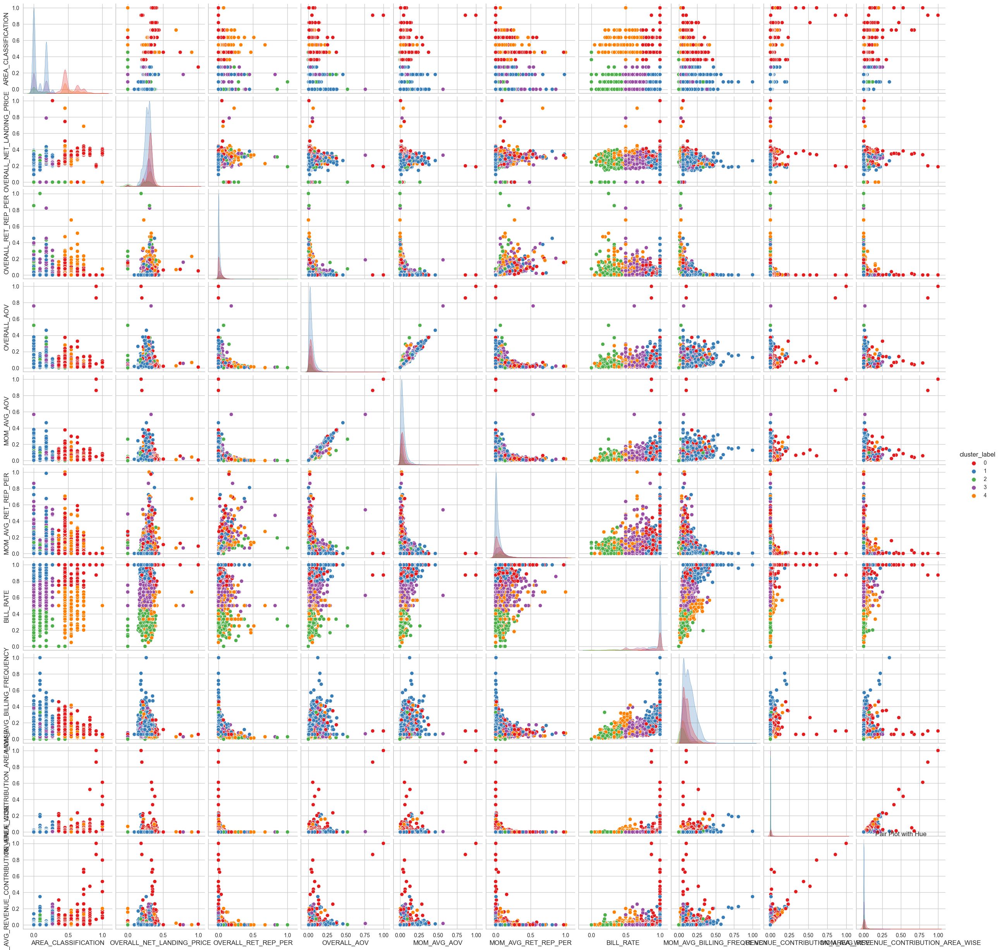

In [94]:
# Assuming 'df' is your DataFrame with columns: feature1, feature2, ..., feature7, cluster_label
sns.pairplot(sum_df_normalized, hue='cluster_label', markers='o', palette='Set1')
plt.title('Pair Plot with Hue')
plt.show()


RETAILER IDS WHOSE CLUSTER LABEL IS 4 

In [96]:
table_df[table_df["cluster_label"]==4][table_df.columns]

,RETAILER_ID,AREA_CLASSIFICATION,CITY_NAME,OVERALL_NET_LANDING_PRICE,OVERALL_RET_REP_PER,OVERALL_AOV,MOM_AVG_AOV,MOM_AVG_RET_REP_PER,BILL_RATE,MOM_AVG_BILLING_FREQUENCY,REVENUE_CONTRIBUTION_AREA_WISE,MOM_AVG_REVENUE_CONTRIBUTION_AREA_WISE,cluster_label
7,3607.0,Indore-GT,Indore,9.966797,0.171875,425.250000,425.250000,0.174603,0.166667,1.000000,0.000275,0.000936,4
24,3276.0,Noida-GT,Noida,11.017045,0.769886,969.500000,283.000000,0.748718,0.250000,0.666667,0.000128,0.000460,4
28,2041.0,Noida-GT,Noida,10.778846,0.424731,999.500000,1008.500000,0.425895,0.600000,1.333333,0.000132,0.003664,4
36,3549.0,Indore-GT,Indore,7.897168,0.170939,2418.023585,2606.704028,0.210140,0.454545,5.300000,0.027642,0.029361,4
38,5224.0,Noida-GT,Noida,11.103659,1.012195,607.000000,453.500000,0.492063,0.500000,1.000000,0.000060,0.000401,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...
5627,2590.0,Noida-GT,Noida,13.500000,0.750000,480.000000,240.000000,0.500000,0.500000,0.500000,0.000016,0.000271,4
5659,5515.0,Noida-GT,Ghaziabad,11.241379,1.100000,900.000000,450.000000,0.912500,0.500000,0.500000,0.000030,0.000291,4
5679,4475.0,Noida-GT,Noida,10.562500,0.125000,845.000000,422.500000,0.500000,0.333333,0.500000,0.000028,0.000387,4
5693,4336.0,Indore-GT,Indore,8.905983,0.000000,1302.500000,1135.000000,0.000000,0.125000,2.000000,0.001124,0.007030,4


In [451]:
table_df[table_df["cluster_label"]==3][table_df.columns].nunique()

RETAILER_ID                               68
AREA_CLASSIFICATION                        5
CITY_NAME                                  6
OVERALL_NET_LANDING_PRICE                 68
OVERALL_RET_REP_PER                       52
OVERALL_AOV                               68
MOM_AVG_AOV                               68
MOM_AVG_RET_REP_PER                       52
BILL_RATE                                 17
MOM_AVG_BILLING_FREQUENCY                 49
REVENUE_CONTRIBUTION_AREA_WISE            68
MOM_AVG_REVENUE_CONTRIBUTION_AREA_WISE    68
cluster_label                              1
dtype: int64

In [449]:
table_df[table_df["cluster_label"]==2][table_df.columns].nunique()

RETAILER_ID                               1620
AREA_CLASSIFICATION                         12
CITY_NAME                                   14
OVERALL_NET_LANDING_PRICE                 1574
OVERALL_RET_REP_PER                       1204
OVERALL_AOV                               1557
MOM_AVG_AOV                               1554
MOM_AVG_RET_REP_PER                       1171
BILL_RATE                                  152
MOM_AVG_BILLING_FREQUENCY                  479
REVENUE_CONTRIBUTION_AREA_WISE            1595
MOM_AVG_REVENUE_CONTRIBUTION_AREA_WISE    1612
cluster_label                                1
dtype: int64